<div style="background-color:#c3faf6; color:#222222; border:3px solid #bee5eb; padding:12px 14px; border-radius:10px; margin:10px 0;">

# How Facial Recognition Bias Compounds Across Race and Gender as Subjects Age


**CS109b Group #103**:

Jenni Arakaki, Laine Roper, Arian Nzioka

**Project #18**: 

Project Proposal: https://drive.google.com/file/d/1yRPxpvg4jQc8gwzPgP_ptiSU6Qs4qmL1/view

# Problem Statement

We've started this project is to train and optimize a visual model to correct facial recognition bias across age, race and gender. 

The motivation is that facial features vary across race and gender as subjects age. A naive model will fail to capture these nuances, our model corrects fot this bais in facial change with aging while tracking them across race and gender.  

**To investigate whether bais that appears modest or acceptable at younger ages becomes more pronounced and unequally distributes at older ages, while tracking race and gender complexity.**


In [1]:
# Standard library
import os
import gc
import time
import warnings

# Numerical computing and data processing
import numpy as np
import pandas as pd
import random
from pathlib import Path
from collections import Counter
import zipfile

# external utilities
import kagglehub
import hashlib

# Visualization
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
from pathlib import Path
import seaborn as sns

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
from torch.cuda.amp import GradScaler, autocast
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torchvision import datasets, models, transforms
from torchvision.models import ResNet50_Weights

# facenet pytorch
from facenet_pytorch import MTCNN
import cv2
from retinaface import RetinaFace

# UMAP
from tqdm import tqdm
from umap import UMAP

SEED = 1090

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Suppress warnings
warnings.filterwarnings('ignore')


cuda


In [2]:
# Suppress warnings
warnings.filterwarnings('ignore')

#Set Seed
def set_seed(seed=1090):
    os.environ["PYTHONHASHSEED"] = str(seed)
    
    random.seed(seed)
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
    # Ensures deterministic behavior in CuDNN
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    # Enforce deterministic algorithms (PyTorch 1.8+)
    torch.use_deterministic_algorithms(True)

set_seed(1090)

def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

torch.use_deterministic_algorithms(False)
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

g = torch.Generator()
g.manual_seed(1090)



### Downloading/Accessing data:
1) Download data from https://www.kaggle.com/datasets/jangedoo/utkface-new.
2) kagglehub library downloads and stores data in `./cache` directory for reproducibility

In [3]:
path = kagglehub.dataset_download("jangedoo/utkface-new")
utk_path = next(Path(path).rglob("UTKFace"))

print("Path Exists  :", utk_path.exists())

print(f"\nDataset downloaded to:", utk_path)

Path Exists  : True

Dataset downloaded to: C:\Users\arian\.cache\kagglehub\datasets\jangedoo\utkface-new\versions\1\UTKFace


In [4]:
# change paths as needed
class FlatImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = Path(img_dir)
        self.files   = [f for f in self.img_dir.rglob("*")
                        if f.name.endswith(".jpg")
                        or f.name.endswith(".jpeg")
                        or f.name.endswith(".png")]
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, self.files[idx].name

dataset = FlatImageDataset(utk_path)

size = 0
img_count = 0
for dirpath, dirnames, filenames in os.walk(utk_path):
    for f in filenames:
        fp = os.path.join(dirpath, f)
        size += os.path.getsize(fp)
        img_count += 1

print(f"Number of images : {img_count}")
print(f"Size on disk   : {size / (1024**2):.2f} MB")

Number of images : 23708
Size on disk   : 114.43 MB


## Datawrangling, EDA, Visualizations

### Labels:

The UTK dataset is a facial close-up collection of labeled images. Each image data features is embedded in the file name, formated like [age]_[gender]_[race]_[date&time].jpg

- `age` is an integer from `0`to `116`, indicating the age
- `gender` is either 0 `male` or 1 `female`
- `race` is an integer from 0 to 4, denoting `White`, `Black`, `Asian`, `Indian`, and `Others` (like `Hispanic`, `Latino`, `Middle Eastern`).
- `date&time` is in the format of `yyyymmddHHMMSSFFF`, showing the date and time an image was collected to UTKFace

**DataFrame from Dataset**

In [5]:
records = []
for fpath in dataset.files:       
    filename = fpath.name
    parts = filename.split("_")
    if len(parts) < 4:
        continue
    try:
        age = int(parts[0])
        gender = int(parts[1])
        race = int(parts[2])
    except ValueError:
        print(f'Error with {filename}')
        continue
    with Image.open(fpath) as im:
        img = im.convert('RGB').copy()
    records.append({
        'age'     : age,
        'gender'  : gender,
        'race'    : race,
        'image'   : img,
        'filename': filename,
    })

df = pd.DataFrame(records)
print(f"\nDataFrame shape: {df.shape}")
display(df.head())


DataFrame shape: (23705, 5)


,age,gender,race,image,filename
0,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112213500903.jpg.chip.jpg
1,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112215240346.jpg.chip.jpg
2,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170110183726390.jpg.chip.jpg
3,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213001988.jpg.chip.jpg
4,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213303693.jpg.chip.jpg


### Visualizing Dataset

filename    20_1_0_20170117193616027.jpg.chip.jpg
Name: 2846, dtype: object


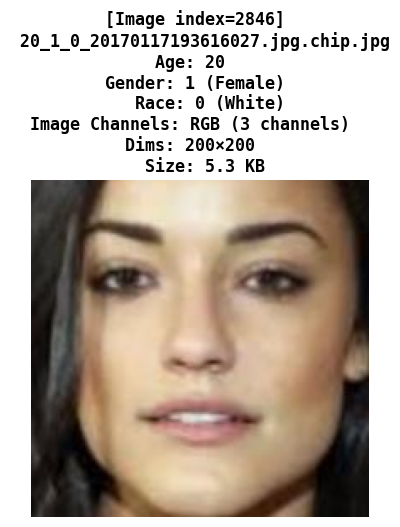

In [6]:
sampled = df.sample(1, random_state=SEED)
row = sampled.iloc[0]
row_index = sampled.index[0]

print(row[-1:])

img = row['image']
width, height = img.size
mode = img.mode
channels = len(img.getbands())
file_path = utk_path / row['filename']
file_size_kb = file_path.stat().st_size / 1024
race_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

fig, ax = plt.subplots(figsize=(4, 5))
ax.imshow(img)
ax.axis('off')
ax.set_title(
    f"[Image index={row_index}] \n {row['filename']}\n"
    f"Age: {row['age']}  \n "
    f"Gender: {row['gender']} ({['Male','Female'][row['gender']]})  \n  "
    f"Race: {row['race']} ({race_map[row['race']]})\n"
    f"Image Channels: {mode} ({channels} channels)  \n"
    f"Dims: {width}×{height}  \n "
    f"Size: {file_size_kb:.1f} KB",
    fontsize=12,
    fontweight='bold',
    family='monospace'
)
plt.tight_layout()
plt.show()

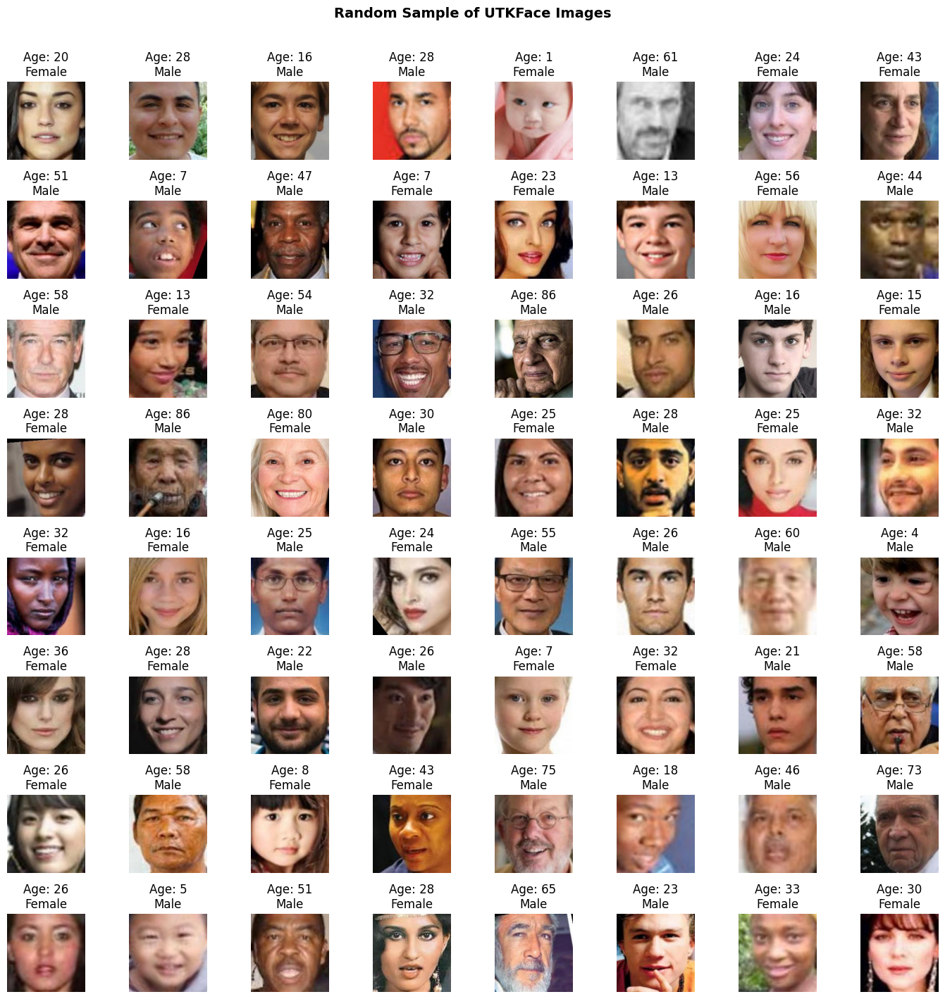

In [7]:
img_path = Path(f'{path}')

dataset = datasets.ImageFolder( img_path )
sample_df = df.sample(64, random_state=SEED).reset_index(drop=True)

fig, axes = plt.subplots(8, 8, figsize=(14, 14))
axes = axes.ravel()

for i, row in sample_df.iterrows():
    ax = axes[i]
    ax.imshow(row['image'])
    ax.set_title(f"Age: {row['age']}\n{['Male','Female'][row['gender']]}", fontsize=12)
    ax.axis('off')

plt.suptitle('Random Sample of UTKFace Images', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

## Preliminary EDA

### Demographics: Age, Gender and Race Distribution

In [8]:
df.describe()

,age,gender,race
count,23705.000000,23705.000000,23705.000000
mean,33.300907,0.477283,1.269226
std,19.885708,0.499494,1.345638
min,1.000000,0.000000,0.000000
25%,23.000000,0.000000,0.000000
50%,29.000000,0.000000,1.000000
75%,45.000000,1.000000,2.000000
max,116.000000,1.000000,4.000000


#### Gender

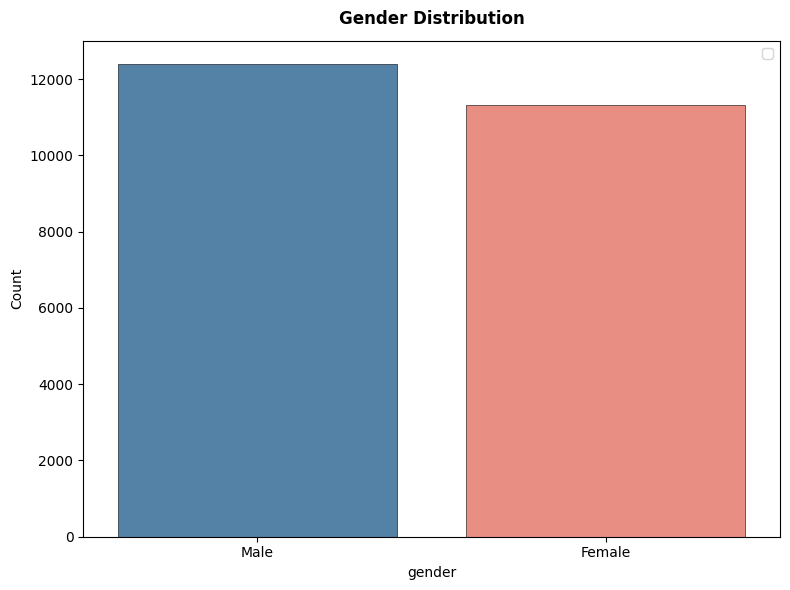

Male   : 12391  (52.3%)
Female : 11314  (47.7%)
M/F ratio: 1.10


In [9]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.countplot(
    data=df,
    x='gender',
    hue='gender',
    palette={0: "steelblue", 1: "salmon"},
    edgecolor="black",
    linewidth=0.4,
    ax=ax
)
ax.set_title("Gender Distribution", fontsize=12, fontweight="bold", pad=12)
ax.set_ylabel("Count")
ax.set_xticks([0, 1])
ax.set_xticklabels(["Male", "Female"])
ax.legend([])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

gender = df['gender'] 
male = []
female = []

for i, gender_val in enumerate(gender):
    if gender_val == 0:
        male.append(gender_val)
    else:
        female.append(gender_val)

count_all, count_m, count_f = len(gender), len(male), len(female)
male_distribution = count_m / count_all * 100
female_distribution = count_f / count_all * 100

gender_balance = male_distribution / female_distribution

print(f"Male   : {len(male)}  ({male_distribution:.1f}%)")
print(f"Female : {len(female)}  ({female_distribution:.1f}%)")
print(f"M/F ratio: {gender_balance:.2f}")        


**Gender distribution is relatively balanced**

The dataset contains ~52% male and ~48% female samples. This indicates minimal gender imbalance overall. However, this balance does not guarantee fairness across subgroups (e.g., within each race or age group)

While the dataset shows a more male sample distributions, at a gender balanace ratio of `1.10` it is not too high to affect the model. 

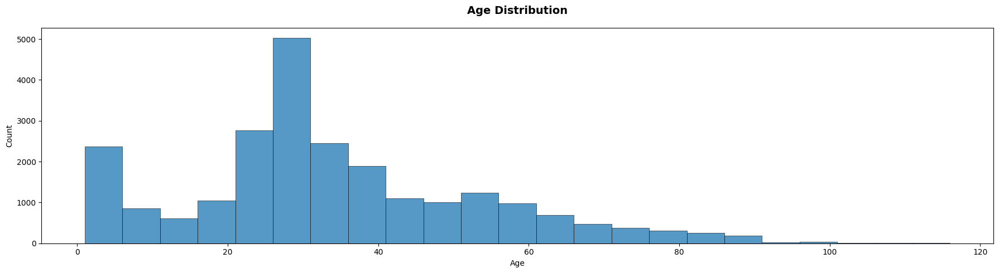

In [10]:
fig, ax = plt.subplots(figsize=(18, 5))

sns.histplot(
    data=df,
    x="age",
    binwidth=5,          
    multiple="dodge",    
    edgecolor="black",
    linewidth=0.4,
    palette="steelblue",
    ax=ax
)

ax.set_title("Age Distribution", fontsize=14, fontweight="bold", pad=18)
ax.set_xlabel("Age")
ax.set_ylabel("Count")
ax.spines[["top", "right"]].set_visible(True)

plt.tight_layout()
plt.show()



**Age distribution is gaussian**

Strong concentration in young adults `20–35`. A Noticeable spike in very young ages `0-5`. Teens `13-19` are underrepresented. A Gradual decline in samples for older ages `60-120`.

#### Gender by Age 

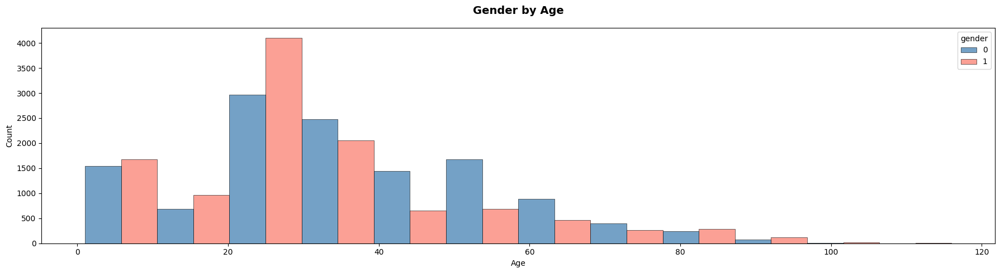

,Male,Female,age_range,total,male_pct,female_pct,pct_of_all
0,1447,1615,0–9,3062,47.3,52.7,12.9
1,681,850,10–19,1531,44.5,55.5,6.5
2,3062,4282,20–29,7344,41.7,58.3,31.0
3,2477,2059,30–39,4536,54.6,45.4,19.1
4,1519,726,40–49,2245,67.7,32.3,9.5
5,1659,640,50–59,2299,72.2,27.8,9.7
6,844,472,60–69,1316,64.1,35.9,5.6
7,440,259,70–79,699,62.9,37.1,2.9
8,203,301,80–89,504,40.3,59.7,2.1
9,52,85,90–99,137,38.0,62.0,0.6


In [11]:
fig, ax = plt.subplots(figsize=(18, 5))

sns.histplot(
    data=df,
    x="age",
    hue="gender",
    binwidth=10,          
    multiple="dodge",    
    edgecolor="black",
    linewidth=0.4,
    palette={0: "steelblue", 1: "salmon"},
    ax=ax
)

ax.set_title("Gender by Age", fontsize=14, fontweight="bold", pad=18)
ax.set_xlabel("Age")
ax.set_ylabel("Count")
ax.spines[["top", "right"]].set_visible(True)

plt.tight_layout()
plt.show()


bin_width = 10
df['age_bin'] = (df['age'] // bin_width) * bin_width

stats_df = (
    df.groupby(['age_bin', 'gender'])
    .size()
    .unstack(fill_value=0)
    .rename(columns={0: 'Male', 1: 'Female'})
    .reset_index()
)

stats_df['age_range']  = stats_df['age_bin'].apply(lambda x: f"{x}–{x + bin_width - 1}")
stats_df['total']      = stats_df['Male'] + stats_df['Female']
stats_df['male_pct']   = (stats_df['Male']   / stats_df['total'] * 100).round(1)
stats_df['female_pct'] = (stats_df['Female'] / stats_df['total'] * 100).round(1)
stats_df['pct_of_all'] = (stats_df['total']  / stats_df['total'].sum() * 100).round(1)
stats = stats_df.reset_index()
stats.columns.name = None
stats = stats.drop(columns=['age_bin','index', 0], errors='ignore')
display(stats)


The highest gender imbalance in the dataset is within the `20-29` age groups where females dominate, approximately `1 male` for every `3 females`, and  the `50-59` age group where males, approximately `1 female` for every `4 males`. The older age groups from `90-119` females dominate, approximately `1 male` for every `4 females`. The older age gender imbalace is expected since females have a higher life expectancy. For the 20's age group it is likely that there are more female samples in this group as females being the more appealing of the genders it is likely that they are more documented and it is expected since UTK samples from popular culture.

**General Distribution**

Males have a higher median age than females.

Male age distribution is shifted older overall.

Females are more concentrated in younger ranges.


#### Race

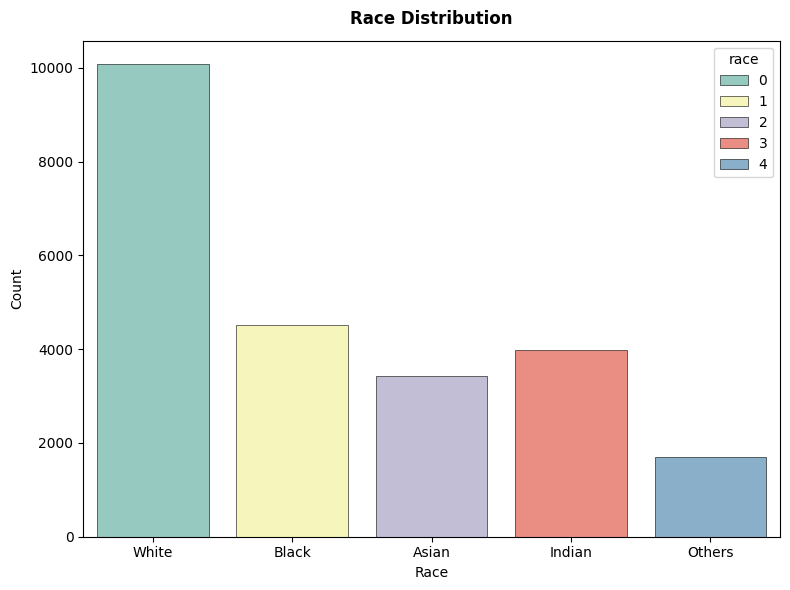

White   : 10,078  (42.5%)
Black : 4,526  (19.1%)
Asian : 3,434  (14.5%)
Indian : 3,434  (16.8%)
Others : 3,975  (7.1%)


In [12]:
races = df['race']
race_labels_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
race_counts = Counter(races)

fig, ax = plt.subplots(figsize=(8,6))

sns.countplot(
    data=df,
    x='race', 
    hue='race',
    palette=dict(enumerate(sns.color_palette("Set3", 5))),
    edgecolor='black',
    linewidth=0.4,
    ax=ax
)

ax.set_title("Race Distribution", fontsize=12, fontweight='bold', pad=12)
ax.set_xlabel('Race')
ax.set_ylabel("Count")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

count_race = df['race'].value_counts()
total = len(df)

white_pct = count_race[0] / total * 100
black_pct = count_race[1] / total * 100
asian_pct = count_race[2] / total * 100
indian_pct = count_race[3] / total * 100
others_pct = count_race[4] / total * 100

print(f"White   : {count_race[0]:,}  ({white_pct:.1f}%)")
print(f"Black : {count_race[1]:,}  ({black_pct:.1f}%)")
print(f"Asian : {count_race[2]:,}  ({asian_pct:.1f}%)")
print(f"Indian : {count_race[2]:,}  ({indian_pct:.1f}%)")
print(f"Others : {count_race[3]:,}  ({others_pct:.1f}%)")


**Significant racial imbalance exists**

White faces dominate (~42.5%)
Other groups are underrepresented by over half the sample size
- Black: ~19%
- Indian: ~16.8%
- Asian: ~14.5%
- Others: ~7.1%

To address this the data model will undersample the white race distribution. 

#### Race by Age

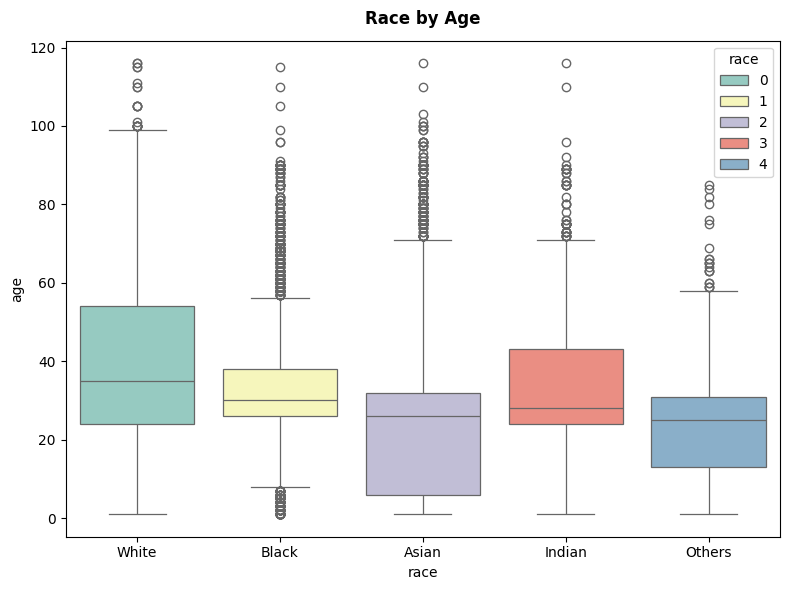

In [13]:
fig, ax = plt.subplots(figsize=(8,6))

sns.boxplot(
    data=df,
    x="race", 
    y="age",
    hue='race',
    palette=dict(enumerate(sns.color_palette("Set3", 5))),
    linewidth=0.9,
    ax=ax
)
ax.set_title("Race by Age", fontsize=12, fontweight='bold', pad=12)
ax.set_xlabel('race')
ax.set_ylabel("age")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()

**Age distribution differs across race (important)**

White group appears to have:
- a higher median age
- and a wider spread

Other groups (e.g., Asian, Others) skew younger
Races have fewer older individuals

#### Race by Gender

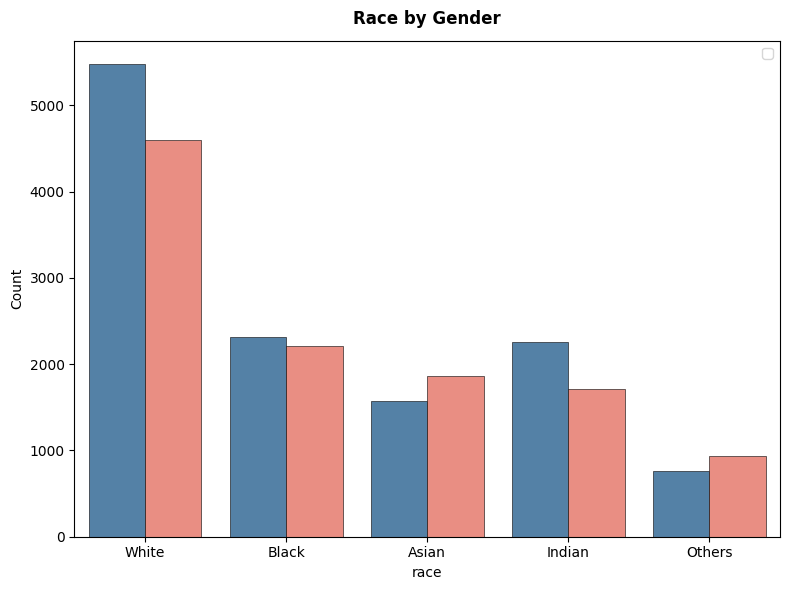

In [14]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    data=df,
    x='race',
    hue='gender',
    palette={0: "steelblue", 1: "salmon"},
    edgecolor="black",
    linewidth=0.4,
    ax=ax
)
ax.set_title("Race by Gender", fontsize=12, fontweight="bold", pad=12)
ax.set_ylabel("Count")
ax.set_xticks(range(5))
ax.set_xticklabels([race_labels_map[i] for i in range(5)])
ax.legend([])
ax.spines[["top", "right"]].set_visible(True)
plt.tight_layout()
plt.show()


**Gender imbalance varies across races**
    
There is even gender balance. The distribution is fair across all races. 

### EDA Summary


- Gender distribution is relatively balanced. With a ratio of `1.10`
- Significant racial imbalance exists. White race dominates `~42.5%` by over half the distribution
- Age distribution is a gaussian distributio., with a strong concentration in young adults `20–35`
- Age distribution differs across gender
- Age distribution differs across race
- Gender imbalance varies across races

## Data Anomaly Detection

### Duplicates Search on Raw Pixels (hashing)

We hashed the image raw prixels and searched for similar has values. This it the main technique we applied to detect identical images.

In [15]:
def hash_image(img):
    """Generate MD5 hash from image pixels."""
    return hashlib.md5(np.array(img).tobytes()).hexdigest()

print("Hashing images...")
df_hash = df.copy()
df_hash['hash'] = [hash_image(img) for img in df['image']]

n_before = len(df)
duplicates = df_hash[df_hash.duplicated(subset='hash', keep=False)]
print(f"Total duplicate images (including originals): {len(duplicates)}")
print(f"Unique duplicate hashes: {df_hash['hash'].duplicated().sum()}")
print(len(df_hash))

Hashing images...
Total duplicate images (including originals): 765
Unique duplicate hashes: 390
23705


23705
Unique duplicate groups: 375


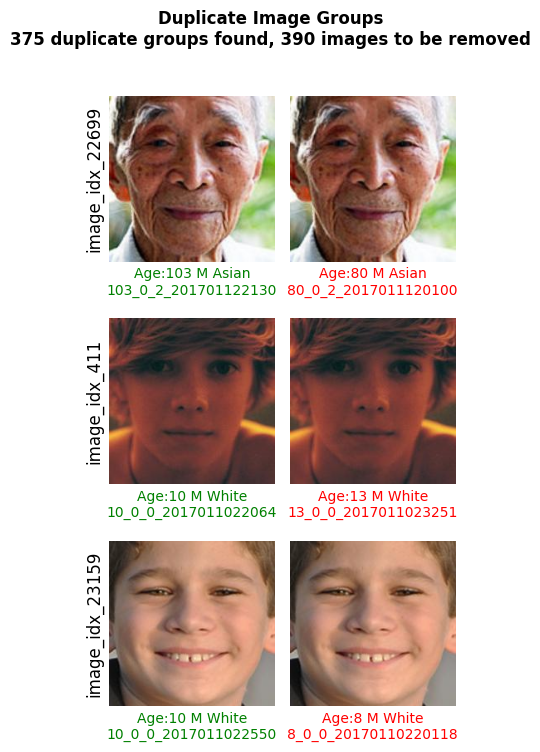

In [16]:
print(len(df_hash))
duplicate_hashes = df_hash[df_hash.duplicated(subset='hash', keep=False)]['hash'].unique()
print(f"Unique duplicate groups: {len(duplicate_hashes)}")

N_GROUPS = 3
selected_hashes = duplicate_hashes[:N_GROUPS]

dup_rows = []
for h in selected_hashes:
    group = df_hash[df_hash['hash'] == h].reset_index().copy()
    group.rename(columns={'index': 'df_index'}, inplace=True)
    dup_rows.append(group)

max_group_size = max(len(g) for g in dup_rows)

fig, axes = plt.subplots(N_GROUPS, max_group_size, figsize=(max_group_size * 2, N_GROUPS * 2.5))

for row_i, group in enumerate(dup_rows):
    for col_i in range(max_group_size):
        ax = axes[row_i, col_i]
        if col_i < len(group):
            r = group.iloc[col_i]
            ax.imshow(r['image'])
            ax.set_xlabel(
                f"Age:{r['age']} {'M' if r['gender']==0 else 'F'} "
                f"{['White','Black','Asian','Indian','Others'][r['race']]}\n"
                f"{r['filename'][:20]}",
                fontsize=10,
                color='red' if col_i > 0 else 'green',
                labelpad=4
            )
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)
                
    axes[row_i, 0].set_ylabel(f"image_idx_{group['df_index'].tolist()[1]}", fontsize=12, rotation=90)
plt.suptitle(
    f"Duplicate Image Groups\n"
    f"{len(duplicate_hashes)} duplicate groups found, "
    f"{df_hash['hash'].duplicated().sum()} images to be removed",
    fontsize=12, fontweight='bold', y=1.0
)
plt.tight_layout()
plt.show()

### Understanding Duplicate Samples

From initial duplicate search we discovered that while the images are identical, the labels were the value change. This exercise will determine how many images are mislabeled, and eventually how we select which to keep in the dataset.

In [17]:
# Understand the duplicate structure
dup_groups = duplicates.groupby('hash').size()
print("Duplicate group size distribution:")
print(dup_groups.value_counts().sort_index())
# e.g. 2 copies: 350 groups, 3 copies: 30 groups, etc.

# Separate into good (first occurrence) and bad (subsequent occurrences)
good_dups = df_hash[df_hash.duplicated(subset='hash', keep='first') == False]  # originals
bad_dups  = df_hash[df_hash.duplicated(subset='hash', keep='first') == True]   # true duplicates

print(f"\nOriginals (keep=first) : {len(good_dups):,}")
print(f"True duplicates        : {len(bad_dups):,}")

Duplicate group size distribution:
2    361
3     13
4      1
Name: count, dtype: int64

Originals (keep=first) : 23,315
True duplicates        : 390


In [18]:
def check_duplicate_consistency(duplicates):
    rows = []
    for hash_val, group in duplicates.groupby('hash'):
        ages    = group['age'].tolist()
        age_vals    = group['age'].unique()
        gender_vals = group['gender'].unique()
        race_vals   = group['race'].unique()
        rows.append({
            'hash'            : hash_val,
            'n_duplicates'    : len(group),
            'ages' : group['age'].tolist(),
            'age_consistent' : len(age_vals) == 1,
            'gender_consistent': len(gender_vals) == 1,
            'race_consistent'  : len(race_vals)   == 1,
            'fully_consistent' : len(age_vals) == 1 and len(gender_vals) == 1 and len(race_vals) == 1,
            'gender_values'   : gender_vals.tolist(),
            'race_values'     : race_vals.tolist(),
        })

    consistency_df = pd.DataFrame(rows).sort_values('ages', ascending=False)

    print(f"Total duplicate groups : {len(consistency_df):,}")
    print(f"Age inconsistent    : {(~consistency_df['age_consistent']).sum():,}")
    print(f"Gender inconsistent    : {(~consistency_df['gender_consistent']).sum():,}")
    print(f"Race inconsistent      : {(~consistency_df['race_consistent']).sum():,}")
    print(f"Fully consistent       : {consistency_df['fully_consistent'].sum():,}")

    return consistency_df

# usage
consistency_df = check_duplicate_consistency(duplicates)
display(consistency_df.head(30))

Total duplicate groups : 375
Age inconsistent    : 205
Gender inconsistent    : 40
Race inconsistent      : 70
Fully consistent       : 116


,hash,n_duplicates,ages,age_consistent,gender_consistent,race_consistent,fully_consistent,gender_values,race_values
235,a204df6c3af5f0df7a125e4ee23d62ee,2,"[103, 80]",False,True,True,False,[0],[2]
329,e2b031eb952791cb601bcb62376f1ad5,2,"[96, 96]",True,True,False,False,[1],"[0, 1]"
183,7e79f816f937a1716c04d2f9dfeec9b4,2,"[86, 88]",False,False,True,False,"[0, 1]",[2]
123,52f8b10914e47e57fde0eb1bcc9c7200,3,"[84, 85, 85]",False,True,True,False,[1],[0]
218,9670fe7e48a08b1a49e77ceda8e83817,2,"[82, 90]",False,True,True,False,[0],[0]
210,9206ff51acb0b802595cf856681265dd,2,"[81, 82]",False,True,True,False,[0],[0]
173,789d717d657548c610529ff08a3ec9d3,2,"[80, 80]",True,True,True,True,[0],[0]
89,3b1c2b7a9c2be11814090f0ac74c6b24,2,"[80, 80]",True,True,True,True,[0],[0]
357,f5e3c64b3d2fde2f0150cfd8767dc7a3,2,"[77, 99]",False,False,False,False,"[0, 1]","[0, 2]"
257,b18f6594a48bf77e3495df7905bd6818,2,"[76, 76]",True,True,True,True,[0],[0]


In [19]:
def get_inconsistent(consistency_df):
    inconsistent_df = consistency_df[
        ~consistency_df['age_consistent']    &
        ~consistency_df['gender_consistent'] &
        ~consistency_df['race_consistent']
    ].reset_index(drop=True)
    return inconsistent_df

fully_inconsistent_df = get_inconsistent(consistency_df)
display(fully_inconsistent_df.head(20))  # was: inconsistent_df

,hash,n_duplicates,ages,age_consistent,gender_consistent,race_consistent,fully_consistent,gender_values,race_values
0,f5e3c64b3d2fde2f0150cfd8767dc7a3,2,"[77, 99]",False,False,False,False,"[0, 1]","[0, 2]"
1,473cc23cf134929724acea48a5301f03,2,"[60, 70]",False,False,False,False,"[1, 0]","[0, 1]"
2,eca5d1474174c8214eb85bfad4fa3709,2,"[26, 31]",False,False,False,False,"[1, 0]","[0, 1]"
3,20e05775941f4b72250b2366cd46494f,2,"[21, 23]",False,False,False,False,"[0, 1]","[4, 1]"
4,9a230fac4d87d8f8c9d2d691971e592c,2,"[16, 26]",False,False,False,False,"[1, 0]","[1, 0]"
5,79506e6cc4534992b58d67e67fe068e8,2,"[15, 23]",False,False,False,False,"[1, 0]","[4, 1]"


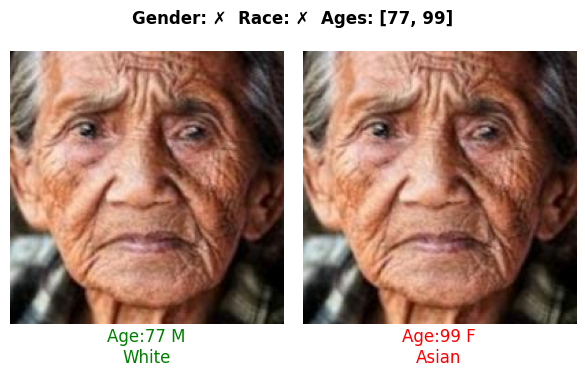

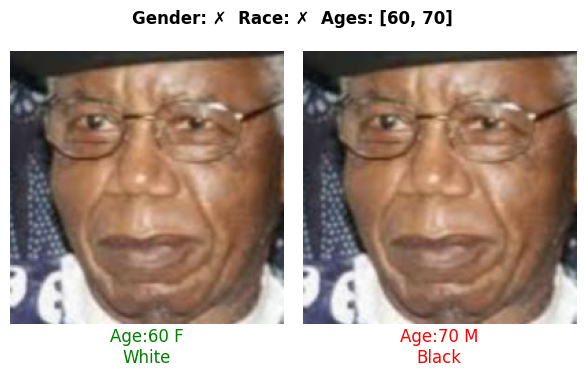

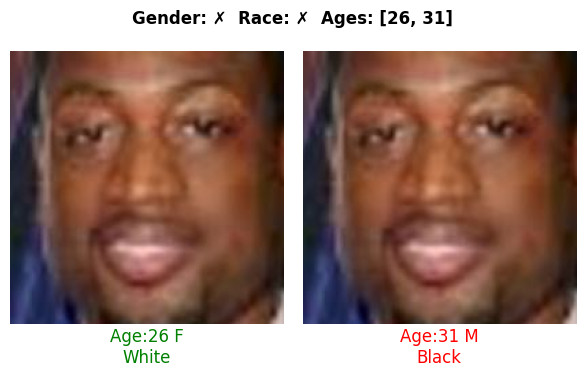

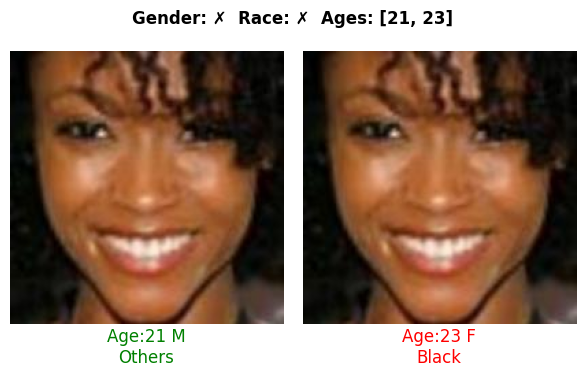

In [20]:
N_GROUPS = 4
fontsize = 12

def plot_inconsistent_groups(ful_incst_df, df, fontsize=fontsize, N_GROUPS=N_GROUPS):

    for _, group_row in list(ful_incst_df.iterrows())[:N_GROUPS]:
        group_imgs = df[df['hash'] == group_row['hash']]
        n = len(group_imgs)
        fig, axes = plt.subplots(1, n, figsize=(n * 3, 3.5))
        axes = [axes] if n == 1 else axes

        for i, (_, r) in enumerate(group_imgs.iterrows()):
            ax = axes[i]
            ax.imshow(r['image'])
            ax.set_xlabel(
                f"Age:{r['age']} {'M' if r['gender']==0 else 'F'}\n"
                f"{['White','Black','Asian','Indian','Others'][r['race']]}",
                fontsize=fontsize,
                color='red' if i > 0 else 'green',
                labelpad=3
            )
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)

        gender_ok = "✓" if group_row['gender_consistent'] else "✗"
        race_ok   = "✓" if group_row['race_consistent']   else "✗"
        plt.suptitle(
            f"Gender: {gender_ok}  Race: {race_ok}  Ages: {group_row['ages']}",
            fontsize=fontsize, fontweight='bold'
        )
        plt.tight_layout()
        plt.show()

    return consistency_df

consistent_df = plot_inconsistent_groups(fully_inconsistent_df, df_hash, fontsize, N_GROUPS)

All duplicate images show misentries across all fields of the dataset, `age`, `gender` and `race`. This is going to be problematic as it will corrupt the embeddings and thus the entire model will be affected. One way to resolve this anomaly is by using SOTA pretrained models to independently detect `age`, `gender` and `race` to pick the highest confidence samples and recreate a clean dataset, but the true bottleneck remains that to train a high accuracy model we'll need a clean dataset which we do not have. The decision was to drop all duplicate image files detected, given that they were less than `0.03%` of the samples. 

In [21]:
df = df_hash[~df_hash['hash'].isin(duplicates['hash'])].reset_index(drop=True)

print(f"Before dedup : {len(df_hash):,}")
print(f"After dedup  : {len(df):,}")
print(f"Dropped      : {len(df_hash) - len(df):,}")

Before dedup : 23,705
After dedup  : 22,940
Dropped      : 765


### Noisy Samples (Non-faces)

In [22]:
def preprocess(img_pil, enhanced=False):
    img = enhance(img_pil) if enhanced else img_pil
    return img.convert('L').convert('RGB').resize((160, 160))

print("Loading images...")
images = [row['image'] for _, row in df.iterrows()]

gray_images   = [preprocess(img) for img in tqdm(images, desc="Preprocessing")]

Loading images...


Preprocessing: 100%|███████████████████████████████████████████████████████████| 22940/22940 [00:11<00:00, 1918.30it/s]


#### MTCNN + HaarCascadeClassifier Fallback + RetinaFace Fallback

We used a pipeline of three complementary detectors in cascade to maximize recall while minimizing false rejections:

**MTCNN: Multi-task Cascaded Convolutional Network** 
A standard model for face detection, jointly detecting faces and landmarks in a single pass. Its drawback is that it struggles with elderly faces, extreme lighting, and non-frontal poses.

**Haar Cascade**
OpenCV's classical Viola-Jones detector, It's to handle cases where `mtcnn` fails due to unusual texture patterns common in elderly or heavily wrinkled faces. 

Three cascades are used to cover different face orientations: 
-frontal alt2
- frontal default
- profile

**RetinaFace**
A SOTA single-stage dense face detector that uses a Feature Pyramid Network backbone. It was to help us handle faces across large scale variations, occlusions, and extreme poses.

For the cascade design, each model only processes images that the previous stage failed on, keeping the pipeline fast while maximizing coverage. 
An image is only flagged as noise if all three detectors fail to find a valid face:
- with sufficient confidence that it is a face using `threshold tuning`
- and a valid face area also a hyperparameter.

This will minimize false positives on valid but challenging face images such as infants, elderly subjects, and dark-skinned individuals.

In [23]:
mtcnn = MTCNN(
    keep_all      = True,
    device        = device,
    post_process  = False,
    min_face_size = 10,             # smaller to catch babies
    thresholds    = [0.8, 0.9, 0.95] # more strict
)

# haar cascade — good fallback for elderly/angled faces
haar = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt2.xml')

def detect_face(img_pil):
    """Returns (has_face, confidence, face_area) using MTCNN + Haar fallback."""
    w, h      = img_pil.size
    img_gray  = img_pil.convert('L').convert('RGB').resize((160, 160))
    img_cv    = np.array(img_pil.convert('L'))  # grayscale for haar

    # ── MTCNN ─────────────────────────────────────────────────────────────────
    try:
        boxes, probs = mtcnn.detect(img_gray)
        if boxes is not None and len(boxes) > 0:
            best_idx  = np.argmax(probs)
            best_prob = float(probs[best_idx])
            best_box  = boxes[best_idx]
            bw = best_box[2] - best_box[0]
            bh = best_box[3] - best_box[1]
            face_area = (bw * bh) / (160 * 160)
            if best_prob >= 0.95 and face_area >= 0.03:
                return True, round(best_prob, 4), round(face_area, 4)
    except Exception:
        pass

    # ── Haar fallback ─────────────────────────────────────────────────────────
    try:
        faces = haar.detectMultiScale(
            img_cv,
            scaleFactor = 1.05,   # finer scale steps
            minNeighbors= 3,      # less strict
            minSize     = (20, 20)
        )
        if len(faces) > 0:
            x, y, fw, fh = max(faces, key=lambda f: f[2] * f[3])  # largest face
            face_area = (fw * fh) / (w * h)
            if face_area >= 0.03:
                return True, 0.95, round(face_area, 4)  # fixed confidence for haar
    except Exception:
        pass

    return False, 0.0, 0.0

# ── Detect ────────────────────────────────────────────────────────────────────
BATCH_SIZE = 64
results    = []

# ── MTCNN batch detection ─────────────────────────────────────────────────────
print("Running MTCNN batch detection...")
mtcnn_results = {}
for i in tqdm(range(0, len(gray_images), BATCH_SIZE), desc="MTCNN"):
    batch = gray_images[i:i + BATCH_SIZE]
    try:
        boxes_batch, probs_batch = mtcnn.detect(batch)
    except Exception:
        boxes_batch = [None] * len(batch)
        probs_batch = [None] * len(batch)

    for j, (boxes, probs) in enumerate(zip(boxes_batch, probs_batch)):
        idx = i + j
        try:
            if boxes is not None and len(boxes) > 0:
                best_idx  = np.argmax(probs)
                best_prob = float(probs[best_idx])
                best_box  = boxes[best_idx]
                bw        = best_box[2] - best_box[0]
                bh        = best_box[3] - best_box[1]
                face_area = (bw * bh) / (160 * 160)
                if best_prob >= 0.95 and face_area >= 0.03:
                    mtcnn_results[idx] = (True, round(best_prob, 4), round(face_area, 4))
                    continue
        except Exception:
            pass
        mtcnn_results[idx] = (False, 0.0, 0.0)

# ── Haar fallback ─────────────────────────────────────────────────────────────
print("Running Haar fallback...")
for idx, (has_face, conf, area) in tqdm(mtcnn_results.items(), desc="Haar"):
    if not has_face:
        img_cv = np.array(images[idx].convert('L'))
        w, h   = images[idx].size
        try:
            faces = haar.detectMultiScale(
                img_cv, scaleFactor=1.05, minNeighbors=3, minSize=(20, 20)
            )
            if len(faces) > 0:
                x, y, fw, fh = max(faces, key=lambda f: f[2] * f[3])
                face_area    = (fw * fh) / (w * h)
                if face_area >= 0.03:
                    mtcnn_results[idx] = (True, 0.95, round(face_area, 4))
        except Exception:
            pass

# ── RetinaFace fallback ───────────────────────────────────────────────────────
print("Running RetinaFace fallback...")
for idx, (has_face, conf, area) in tqdm(mtcnn_results.items(), desc="RetinaFace"):
    if not has_face:
        try:
            img_np = np.array(images[idx].convert('RGB'))
            faces  = RetinaFace.detect_faces(img_np)
            if isinstance(faces, dict) and len(faces) > 0:
                best        = max(faces.values(), key=lambda f: f['score'])
                score       = best['score']
                x1, y1, x2, y2 = best['facial_area']
                w, h        = images[idx].size
                face_area   = ((x2 - x1) * (y2 - y1)) / (w * h)
                if score >= 0.95 and face_area >= 0.03:
                    mtcnn_results[idx] = (True, round(score, 4), round(face_area, 4))
        except Exception:
            pass

# ── Build results df — AFTER all three detectors ──────────────────────────────
results = []
for idx in range(len(df)):
    has_face, conf, area = mtcnn_results.get(idx, (False, 0.0, 0.0))
    results.append({
        'df_index'  : idx,
        'filename'  : df.iloc[idx]['filename'],
        'age'       : df.iloc[idx]['age'],
        'gender'    : df.iloc[idx]['gender'],
        'race'      : df.iloc[idx]['race'],
        'has_face'  : has_face,
        'confidence': conf,
        'face_area' : area,
    })

detect_df  = pd.DataFrame(results)

Running MTCNN batch detection...


MTCNN: 100%|█████████████████████████████████████████████████████████████████████████| 359/359 [00:51<00:00,  6.94it/s]


Running Haar fallback...


Haar: 100%|████████████████████████████████████████████████████████████████████| 22940/22940 [00:15<00:00, 1439.52it/s]


Running RetinaFace fallback...


RetinaFace: 100%|████████████████████████████████████████████████████████████████| 22940/22940 [34:01<00:00, 11.24it/s]


In [24]:
def build_clean_df(df, detect_df):
    clean_mask = detect_df['has_face']
    noise_mask = ~clean_mask
    clean_df   = df.copy()[clean_mask.values].reset_index(drop=True)
    noise_df   = detect_df[noise_mask].sort_values('confidence', ascending=True)

    print(f"Total images : {len(df):,}")
    print(f"Clean images : {clean_mask.sum():,}  ({clean_mask.mean()*100:.1f}%)")
    print(f"Noise images : {noise_mask.sum():,}  ({noise_mask.mean()*100:.1f}%)")

    return clean_df, noise_df, clean_mask, noise_mask

clean_df, noise_df, clean_mask, noise_mask = build_clean_df(df, detect_df)

Total images : 22,940
Clean images : 22,425  (97.8%)
Noise images : 515  (2.2%)


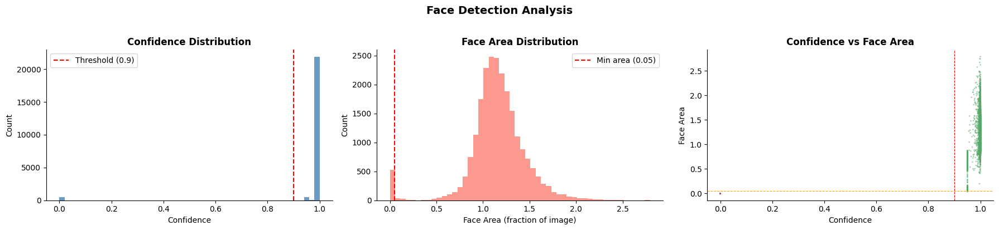

In [25]:
# ── Confidence + Area Scatter ─────────────────────────────────────────────────
CONF_THRESHOLD = 0.9
AREA_THRESHOLD = 0.05

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

sns.histplot(
    detect_df['confidence'], 
    bins=50, 
    color='steelblue', 
    edgecolor='none', 
    alpha=0.8, 
    ax=axes[0]
)
axes[0].axvline(CONF_THRESHOLD, color='red', linestyle='--', label=f'Threshold ({CONF_THRESHOLD})')
axes[0].set_title("Confidence Distribution", fontweight='bold')
axes[0].set_xlabel("Confidence")
axes[0].set_ylabel("Count")
axes[0].legend()
axes[0].spines[['top', 'right']].set_visible(False)

sns.histplot(
    detect_df['face_area'], 
    bins=50, 
    color='salmon', 
    edgecolor='none', 
    alpha=0.8, 
    ax=axes[1]
)
axes[1].axvline(AREA_THRESHOLD, color='red', linestyle='--', label=f'Min area ({AREA_THRESHOLD})')
axes[1].set_title("Face Area Distribution", fontweight='bold')
axes[1].set_xlabel("Face Area (fraction of image)")
axes[1].set_ylabel("Count")
axes[1].legend()
axes[1].spines[['top', 'right']].set_visible(False)

colors = ['#55A868' if c else '#C44E52' for c in clean_mask]
axes[2].scatter(detect_df['confidence'], detect_df['face_area'], c=colors, s=1, alpha=0.4)
axes[2].axvline(CONF_THRESHOLD, color='red',    linestyle='--', linewidth=0.8)
axes[2].axhline(AREA_THRESHOLD, color='orange', linestyle='--', linewidth=0.8)
axes[2].set_title("Confidence vs Face Area", fontweight='bold')
axes[2].set_xlabel("Confidence")
axes[2].set_ylabel("Face Area")
axes[2].spines[['top', 'right']].set_visible(False)

plt.suptitle("Face Detection Analysis", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

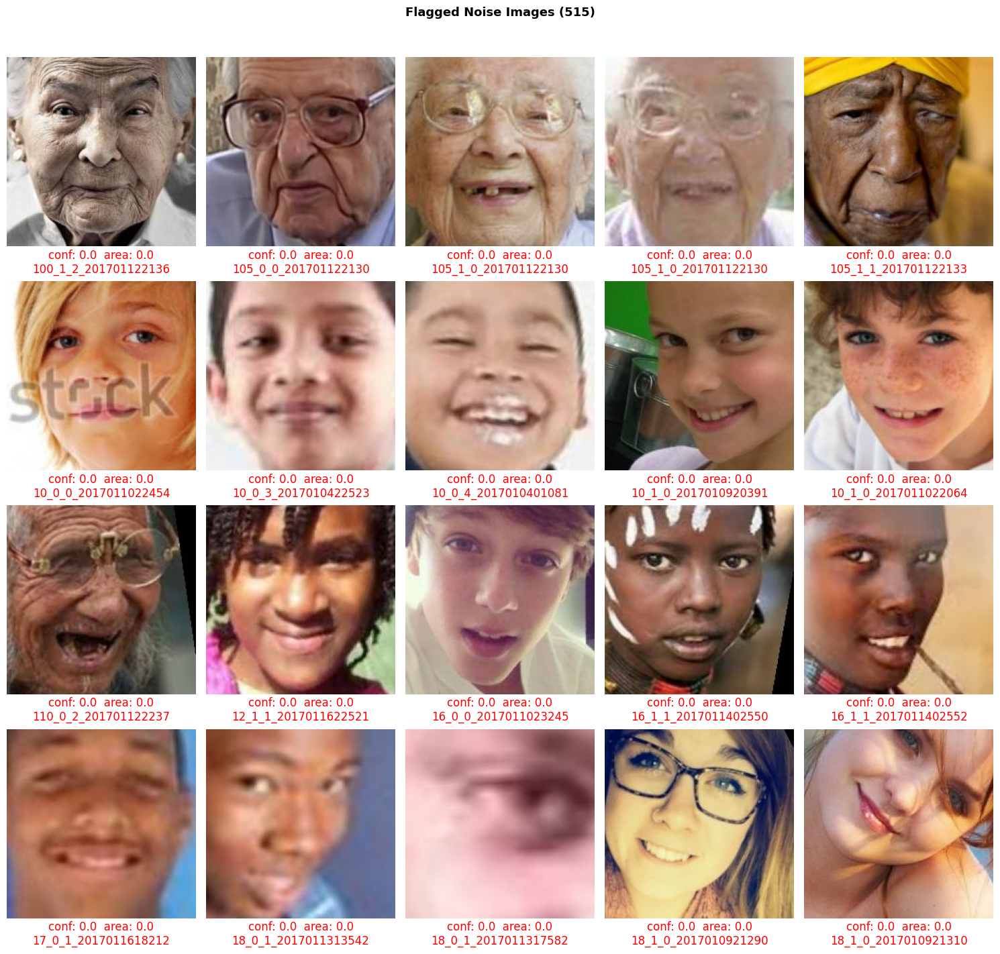

In [26]:
def plot_noise(noise_df, df, noise_mask, N=20, cols=5, fontsize=7):
    """
    Plot flagged noise images in a grid.

    Args:
        noise_df   : DataFrame of flagged noise images
        df         : Original DataFrame with images
        noise_mask : Boolean mask of noise images
        N          : Max images to plot
        cols       : Number of columns in grid
        fontsize   : Label font size
    """
    N    = min(N, len(noise_df))
    rows = N // cols + int(N % cols > 0)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
    axes      = axes.flatten()

    for i, (_, r) in enumerate(noise_df.head(N).iterrows()):
        ax  = axes[i]
        img = df.iloc[r['df_index']]['image']
        ax.imshow(img)
        ax.set_xlabel(
            f"conf: {r['confidence']}  area: {r['face_area']}\n{r['filename'][:20]}",
            fontsize=fontsize, color='red', labelpad=3
        )
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Flagged Noise Images ({noise_mask.sum()})", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

plot_noise(noise_df, df, noise_mask, N=20, cols=5, fontsize=12)

In [27]:
df = clean_df.reset_index(drop=True)
print(f"df updated: {df.shape}")
display(df.head(10))

df updated: (22425, 7)


,age,gender,race,image,filename,age_bin,hash
0,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112213500903.jpg.chip.jpg,100,60ef11f61d2438b5f888290aaf872c4b
1,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112215240346.jpg.chip.jpg,100,773533b80e53a7c00926e3bcbba531ac
2,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170110183726390.jpg.chip.jpg,100,4ffcccc2344018af755834d3b7e43df5
3,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213001988.jpg.chip.jpg,100,5978a2642dec0a74e3fdef28194ffa25
4,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213303693.jpg.chip.jpg,100,8d60d0821238ef1b2adadd4268ed0be3
5,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112215032192.jpg.chip.jpg,100,7ec1d66cec7eeff034d0a2c45dd190f0
6,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170117195420803.jpg.chip.jpg,100,11e0653c7f4dfea9a52d70d895bfba0c
7,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170119212053665.jpg.chip.jpg,100,9defe561b01ce8969fe22edf58cb1537
8,100,1,2,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_2_20170105174847679.jpg.chip.jpg,100,b5d5c70e90524cb3dbaa7194fb8ffb84
9,100,1,2,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_2_20170112222336458.jpg.chip.jpg,100,12d9efc38d371c7f65881b617ae3bef0


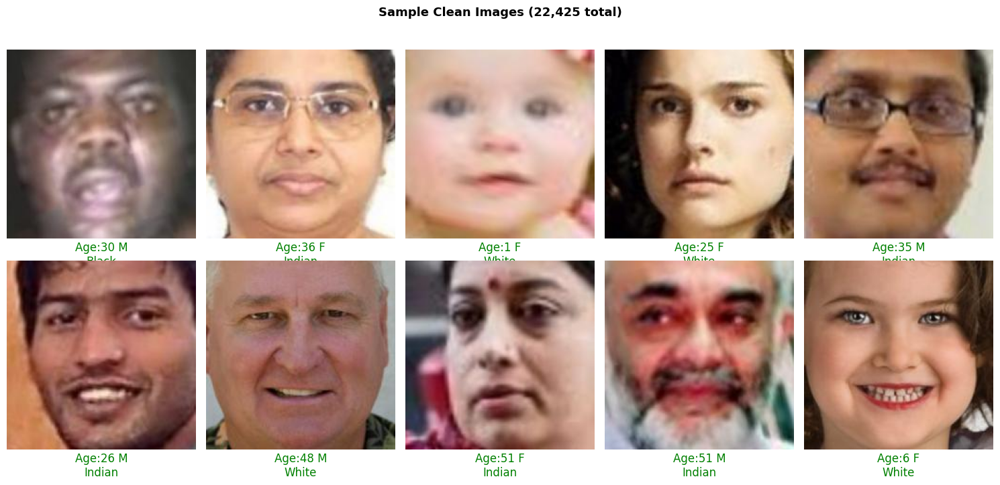

In [28]:
def plot_clean(df, N=80, cols=5, fontsize=12):
    """
    Plot a random sample of clean images.

    Args:
        clean_df  : Filtered DataFrame with clean images
        N         : Max images to plot
        cols      : Number of columns in grid
        fontsize  : Label font size
    """
    N      = min(N, len(df))
    sample = df.sample(N, random_state=SEED)
    rows   = N // cols + int(N % cols > 0)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
    axes      = axes.flatten()

    for i, (_, r) in enumerate(sample.iterrows()):
        ax  = axes[i]
        ax.imshow(r['image'])
        ax.set_xlabel(
            f"Age:{r['age']} {'M' if r['gender']==0 else 'F'}\n"
            f"{['White','Black','Asian','Indian','Others'][r['race']]}",
            fontsize=fontsize, color='green', labelpad=3
        )
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Sample Clean Images ({len(df):,} total)", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

# usage
plot_clean(df, N=10, cols=5)

### ResNet50 First Pass Age Detector

In [29]:
class FaceAgeDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df        = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        image = row['image']
        age   = torch.tensor(row['age'], dtype=torch.float32)
        if self.transform:
            image = self.transform(image)
        return image, age

train_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

infer_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

dataset    = FaceAgeDataset(df, transform=train_transform)
val_size   = int(0.1 * len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=128, shuffle=True,  num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=128, shuffle=False, num_workers=0, pin_memory=True)

class AgeRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        backbone = models.resnet50(weights='IMAGENET1K_V1')
        # freeze up to layer2, unfreeze layer3, layer4, fc
        for name, param in backbone.named_parameters():
            if 'layer3' not in name and 'layer4' not in name and 'fc' not in name:
                param.requires_grad = False
        backbone.fc = nn.Sequential(
            nn.Linear(backbone.fc.in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 1)
        )
        self.model = backbone

    def forward(self, x):
        return self.model(x).squeeze(1)

RETRAIN = False  # set to True to retrain, False to load saved model

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using: {torch.cuda.get_device_name(0)}")

model = AgeRegressor().to(device)

if RETRAIN or not os.path.exists('best_model.pth'):
    print("Training model from scratch...")
    criterion  = nn.L1Loss()
    optimizer  = optim.Adam([
        {'params': model.model.layer3.parameters(), 'lr': 1e-5},
        {'params': model.model.layer4.parameters(), 'lr': 1e-4},
        {'params': model.model.fc.parameters(),     'lr': 1e-3},
    ], weight_decay=1e-5)
    scheduler  = CosineAnnealingLR(optimizer, T_max=30)
    scaler     = GradScaler()
    EPOCHS     = 30
    best_val   = float('inf')
    patience   = 7
    no_improve = 0

    for epoch in range(EPOCHS):
        model.train()
        train_loss = 0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]", leave=False)
        for images, ages in pbar:
            images, ages = images.to(device, non_blocking=True), ages.to(device, non_blocking=True)
            optimizer.zero_grad()
            with autocast():
                preds = model(images)
                loss  = criterion(preds, ages)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_loss += loss.item()
            pbar.set_postfix(loss=f"{loss.item():.2f}")

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for images, ages in tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]", leave=False):
                images, ages = images.to(device, non_blocking=True), ages.to(device, non_blocking=True)
                with autocast():
                    preds = model(images)
                val_loss += criterion(preds, ages).item()

        scheduler.step()
        avg_train = train_loss / len(train_loader)
        avg_val   = val_loss   / len(val_loader)
        print(f"Epoch {epoch+1:>2}/{EPOCHS}  train_mae: {avg_train:.2f}  val_mae: {avg_val:.2f}")

        if avg_val < best_val:
            best_val   = avg_val
            no_improve = 0
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"  ✓ saved best model  (val_mae: {best_val:.2f})")
        else:
            no_improve += 1
            print(f"  no improvement {no_improve}/{patience}")
            if no_improve >= patience:
                print("Early stopping triggered")
                break

    print(f"\nBest val_mae: {best_val:.2f}")

else:
    print("Loading saved model...")

model.load_state_dict(torch.load('best_model.pth', map_location=device))
model.eval()
print("Model ready.")

AGE_THRESHOLD = 10
infer_ds      = FaceAgeDataset(df, transform=infer_transform)
infer_loader  = DataLoader(infer_ds, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)

results = []
with torch.no_grad():
    for i, (images, ages) in enumerate(tqdm(infer_loader, desc="Inferring")):
        images = images.to(device, non_blocking=True)
        with autocast():
            preds = model(images).cpu().numpy()
        ages  = ages.numpy()
        start = i * infer_loader.batch_size
        for j, (pred, age) in enumerate(zip(preds, ages)):
            idx = start + j
            results.append({
                'df_index'   : idx,
                'filename'   : df.iloc[idx]['filename'],
                'labeled_age': int(age),
                'pred_age'   : round(float(pred), 1),
                'error'      : round(abs(float(pred) - float(age)), 1),
                'flagged'    : abs(float(pred) - float(age)) > AGE_THRESHOLD
            })

results_df = pd.DataFrame(results)
flagged_df = results_df[results_df['flagged']].sort_values('error', ascending=False)
print(f"\nFlagged misentries: {len(flagged_df)} / {len(df)}")
print(flagged_df.head(20).to_string())

Using: NVIDIA GeForce RTX 4070 Laptop GPU
Loading saved model...
Model ready.


Inferring: 100%|███████████████████████████████████████████████████████████████████████| 88/88 [00:23<00:00,  3.68it/s]



Flagged misentries: 1246 / 22425
       df_index                                filename  labeled_age  pred_age  error  flagged
1709       1709    1_0_2_20161219161843718.jpg.chip.jpg            1      84.3   83.3     True
21826     21826   86_1_2_20170105174652949.jpg.chip.jpg           86      19.4   66.6     True
19169     19169    5_0_1_20170117193745507.jpg.chip.jpg            5      67.9   62.9     True
21942     21942    8_0_0_20170117182551223.jpg.chip.jpg            8      59.6   51.6     True
21547     21547   80_1_0_20170117155129695.jpg.chip.jpg           80      30.3   49.7     True
160         160  111_1_0_20170120134646399.jpg.chip.jpg          111      63.1   47.9     True
22181     22181   90_0_1_20170111205407457.jpg.chip.jpg           90      47.0   43.0     True
20901     20901   72_1_0_20170110141531648.jpg.chip.jpg           72      31.4   40.6     True
20501     20501   68_1_1_20170116161411128.jpg.chip.jpg           68      27.5   40.5     True
14294     14294 

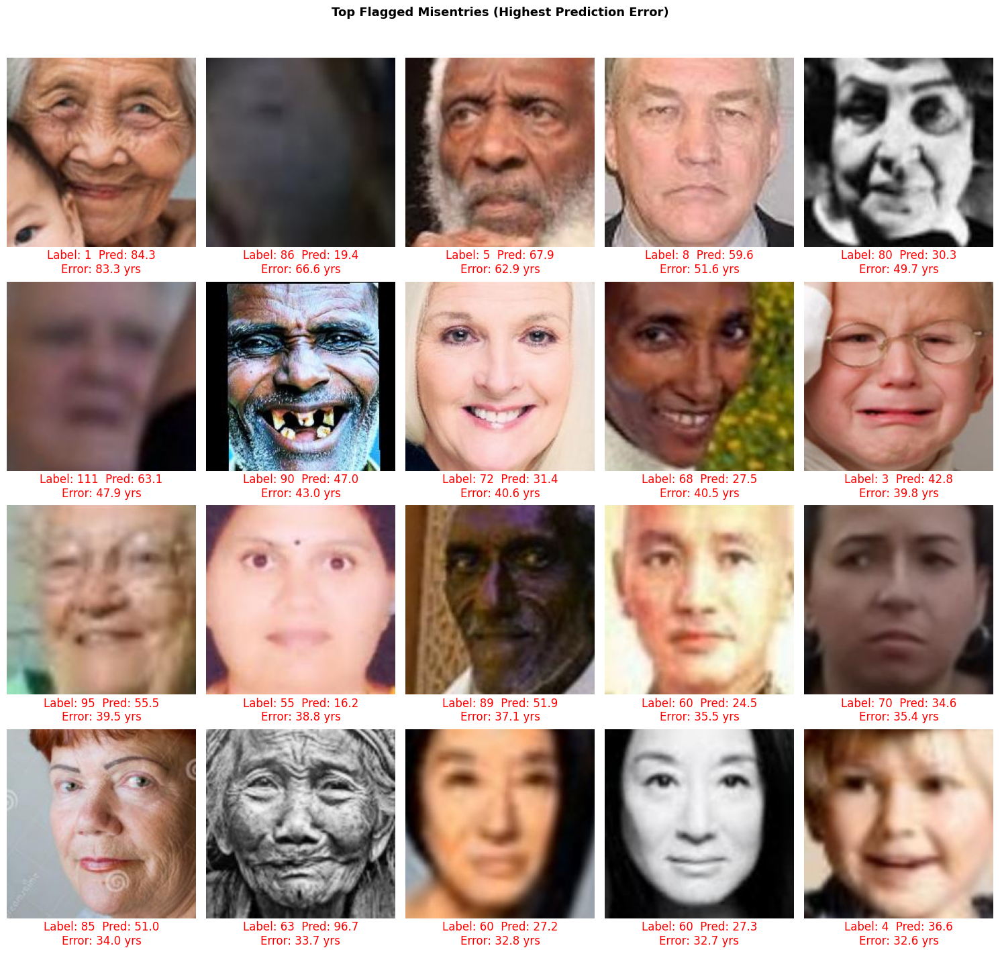

In [30]:
N         = 20
sample_df = flagged_df.head(N)
cols      = 5
rows      = N // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))

for i, (_, r) in enumerate(sample_df.iterrows()):
    ax  = axes[i // cols, i % cols]
    img = df.iloc[r['df_index']]['image']
    ax.imshow(img)
    ax.set_xlabel(
        f"Label: {r['labeled_age']}  Pred: {r['pred_age']}\n"
        f"Error: {r['error']} yrs",
        fontsize=12, color='red', labelpad=3
    )
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.suptitle("Top Flagged Misentries (Highest Prediction Error)", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

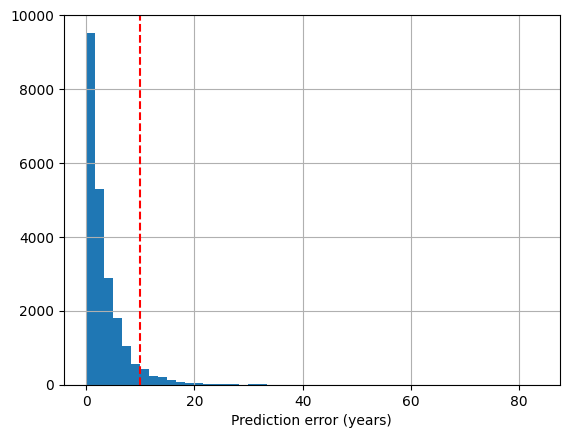

In [31]:
results_df['error'].hist(bins=50)
plt.axvline(AGE_THRESHOLD, color='red', linestyle='--', label='threshold')
plt.xlabel('Prediction error (years)')
plt.show()

In [32]:
def build_misentry_df(df, flagged_df):
    """
    Build misentry DataFrame and clean df by removing flagged misentries.

    Args:
        df         : Original DataFrame
        flagged_df : DataFrame of ResNet-flagged age misentries

    Returns:
        misentry_df : Full misentry info DataFrame
        df_clean    : df with misentries removed
    """
    race_labels   = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
    gender_labels = {0: 'Male', 1: 'Female'}

    # merge to get gender and race labels
    misentry_df = flagged_df.merge(
        df[['filename', 'gender', 'race']],
        on='filename', how='left'
    ).copy()
    misentry_df['gender_label'] = misentry_df['gender'].map(gender_labels)
    misentry_df['race_label']   = misentry_df['race'].map(race_labels)
    misentry_df = misentry_df.sort_values('error', ascending=False).reset_index(drop=True)

    # ── Statistics ────────────────────────────────────────────────────────────
    print("=" * 50)
    print("MISENTRY STATISTICS")
    print("=" * 50)
    print(f"\nTotal flagged  : {len(misentry_df):,}")
    print(f"\nAge error stats:")
    print(f"  Mean error   : {misentry_df['error'].mean():.1f} years")
    print(f"  Max error    : {misentry_df['error'].max():.1f} years")
    print(f"  Labeled age  : min={misentry_df['labeled_age'].min()}  "
          f"max={misentry_df['labeled_age'].max()}  "
          f"mean={misentry_df['labeled_age'].mean():.1f}")

    print(f"\nBy Gender:")
    for g, label in gender_labels.items():
        count = (misentry_df['gender'] == g).sum()
        pct   = count / len(misentry_df) * 100
        print(f"  {label:<8}: {count:,}  ({pct:.1f}%)")

    print(f"\nBy Race:")
    for r, label in race_labels.items():
        count = (misentry_df['race'] == r).sum()
        pct   = count / len(misentry_df) * 100
        print(f"  {label:<8}: {count:,}  ({pct:.1f}%)")

    print(f"\nTop flagged age labels:")
    print(misentry_df['labeled_age'].value_counts().sort_index().head(10).to_string())

    # ── Drop from df ──────────────────────────────────────────────────────────
    before   = len(df)
    df_clean = df[~df['filename'].isin(misentry_df['filename'])].reset_index(drop=True)
    after    = len(df_clean)

    print(f"\n{'='*50}")
    print(f"Before : {before:,}")
    print(f"After  : {after:,}")
    print(f"Dropped: {before - after:,}")

    return misentry_df, df_clean

# usage
misentry_df, df_clean = build_misentry_df(df, flagged_df)
display(misentry_df.head(20))

MISENTRY STATISTICS

Total flagged  : 1,246

Age error stats:
  Mean error   : 14.7 years
  Max error    : 83.3 years
  Labeled age  : min=1  max=116  mean=50.2

By Gender:
  Male    : 649  (52.1%)
  Female  : 597  (47.9%)

By Race:
  White   : 669  (53.7%)
  Black   : 224  (18.0%)
  Asian   : 103  (8.3%)
  Indian  : 199  (16.0%)
  Others  : 51  (4.1%)

Top flagged age labels:
labeled_age
1      5
2      4
3      1
4      2
5      5
6      3
7      3
8     10
9     14
10     2

Before : 22,425
After  : 21,179
Dropped: 1,246


,df_index,filename,labeled_age,pred_age,error,flagged,gender,race,gender_label,race_label
0,1709,1_0_2_20161219161843718.jpg.chip.jpg,1,84.3,83.3,True,0,2,Male,Asian
1,21826,86_1_2_20170105174652949.jpg.chip.jpg,86,19.4,66.6,True,1,2,Female,Asian
2,19169,5_0_1_20170117193745507.jpg.chip.jpg,5,67.9,62.9,True,0,1,Male,Black
3,21942,8_0_0_20170117182551223.jpg.chip.jpg,8,59.6,51.6,True,0,0,Male,White
4,21547,80_1_0_20170117155129695.jpg.chip.jpg,80,30.3,49.7,True,1,0,Female,White
5,160,111_1_0_20170120134646399.jpg.chip.jpg,111,63.1,47.9,True,1,0,Female,White
6,22181,90_0_1_20170111205407457.jpg.chip.jpg,90,47.0,43.0,True,0,1,Male,Black
7,20901,72_1_0_20170110141531648.jpg.chip.jpg,72,31.4,40.6,True,1,0,Female,White
8,20501,68_1_1_20170116161411128.jpg.chip.jpg,68,27.5,40.5,True,1,1,Female,Black
9,14294,3_0_0_20170110212752045.jpg.chip.jpg,3,42.8,39.8,True,0,0,Male,White


### Dataset 

In [33]:
class DFDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row    = self.df.iloc[idx]
        img    = row['image']
        age    = row['age']
        gender = row['gender']
        race   = row['race']

        if self.transform:
            img = self.transform(img)

        return img, age, gender, race

transform = transforms.Compose([
    transforms.ToTensor(),
])

clean_dataset = DFDataset(df, transform=transform)

print(f"Clean dataset size: {len(clean_dataset):,} images")
print(f"Sample: {clean_dataset[0][0].shape}, age={clean_dataset[0][1]}, gender={clean_dataset[0][2]}, race={clean_dataset[0][3]}")

Clean dataset size: 22,425 images
Sample: torch.Size([3, 200, 200]), age=100, gender=0, race=0


## Baseline Model ResNet Training

### Train val test split

Stratifying so each the proportions of each split match the proportions in the entire dataset.

Because some fine-grained age × race × gender subgroups contained too few samples for reliable stratified splitting, we stratified by race and gender only, while reserving age bins for downstream fairness evaluation.

Our model predicts age (continuous) and gender (binary) via two different heads attached to ResNet18. For analysis of performance, we bin the predicted ages, especially to see the effect of a low number of teen training images. We use ResNet for it's simple architecture. 

Our metrics evaluate model performance across demographic subgroups by breaking predictions into intersections of race, gender, and age bins. For gender classification, we compute subgroup inaccuracy and for age regression we use mean absolute error (MAE) to measure prediction distance from the true age. By structuring results as heatmaps over group combinations, we can directly compare whether errors are uniformly distributed or concentrated in specific populations, revealing potential bias or performance disparities.

In [34]:
labels = ["0_5",      # infants / toddlers
          "5_13",     # children
          "13_20",    # teens
          "21_40",
          "41_60",
          "61_80",
          "80_plus"
]

df["eval_age_bin"] = pd.cut(
    df["age"],
    bins = [0, 5, 13, 20, 40, 60, 80, 120],
    labels = labels,
    include_lowest=True
)

# simple stratification key
df["stratify_key"] = (
    df["race"].astype(str) + "_" +
    df["gender"].astype(str) + "_"
)

# remove very tiny groups if stratification breaks
valid_keys = df["stratify_key"].value_counts()
valid_keys = valid_keys[valid_keys >= 2].index
df_split = df[df["stratify_key"].isin(valid_keys)].copy()

train_df, temp_df = train_test_split(
    df_split,
    test_size=0.30,
    random_state=42,
    stratify=df_split["stratify_key"]
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["stratify_key"]
)

print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

Train size: 15697
Validation size: 3364
Test size: 3364


### First Pass ResNet CNN

In [35]:
class UTKFaceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # already a PIL image
        image = row["image"]

        if self.transform:
            image = self.transform(image)

        age = torch.tensor(row["age"], dtype=torch.float32)
        gender = torch.tensor(row["gender"], dtype=torch.float32)

        race = str(row["race"])
        age_bin = str(row["eval_age_bin"])

        return image, age, gender, race, age_bin

In [36]:
IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225] #normalize

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

# dataloaders
train_dataset = UTKFaceDataset(train_df, transform=train_transform)
val_dataset = UTKFaceDataset(val_df, transform=val_transform)
test_dataset = UTKFaceDataset(test_df, transform=test_transform)

train_loader = DataLoader( #changed for seed
    train_dataset,
    batch_size=64,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=g,
    num_workers=0
)
val_loader = DataLoader( #changed for seed
    val_dataset,
    batch_size=64,
    shuffle=False,
    worker_init_fn=seed_worker,
    generator=g,
    num_workers=0
)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=0)
    
class MultiTaskResNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.age_head = nn.Linear(in_features, 1)
        self.gender_head = nn.Linear(in_features, 1)

    def forward(self, x, return_features=False):
        features = self.backbone(x)

        age_pred = self.age_head(features).squeeze(1)
        gender_logit = self.gender_head(features).squeeze(1)

        if return_features:
            return age_pred, gender_logit, features

        return age_pred, gender_logit
    
def extract_embeddings(model, loader, device):
    model.eval()

    embeddings = []
    age_preds = []
    gender_preds = []
    age_bins = []
    races = []
    genders = []

    with torch.no_grad():
        for images, ages, gender, race, age_bin in loader:
            images = images.to(device)

            age_pred, gender_logit, features = model(images, return_features=True)

            gender_pred = (torch.sigmoid(gender_logit) >= 0.5).float()

            embeddings.append(features.cpu())
            age_preds.append(age_pred.cpu())
            gender_preds.append(gender_pred.cpu())

            age_bins.extend(age_bin)
            races.extend(race)
            genders.extend(gender)

    return {
        "embeddings": torch.cat(embeddings),
        "age_pred": torch.cat(age_preds),
        "gender_pred": torch.cat(gender_preds),
        "age_bin": np.array(age_bins),
        "race": np.array(races),
        "gender": np.array(genders)
    }

def train_one_epoch(model, loader, optimizer, age_criterion, gender_criterion, device):
    model.train()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    for images, ages, genders, _, _ in tqdm(loader, desc="Training"):
        images = images.to(device)
        ages = ages.to(device)
        genders = genders.to(device)

        optimizer.zero_grad()

        age_pred, gender_logit = model(images)

        age_loss = age_criterion(age_pred, ages)
        gender_loss = gender_criterion(gender_logit, genders)

        loss = age_loss + gender_loss
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        total_age_loss += age_loss.item() * images.size(0)
        total_gender_loss += gender_loss.item() * images.size(0)

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n
    }

def evaluate(model, loader, age_criterion, gender_criterion, device):
    model.eval()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    all_age_preds = []
    all_ages = []
    all_gender_preds_list = []
    all_genders = []

    with torch.no_grad():
        for images, ages, genders, _, _ in loader:
            images = images.to(device)
            ages = ages.to(device)
            genders = genders.to(device)

            age_pred, gender_logit = model(images)

            age_loss = age_criterion(age_pred, ages)
            gender_loss = gender_criterion(gender_logit, genders)
            loss = age_loss + gender_loss

            total_loss += loss.item() * images.size(0)
            total_age_loss += age_loss.item() * images.size(0)
            total_gender_loss += gender_loss.item() * images.size(0)

            gender_preds = (torch.sigmoid(gender_logit) >= 0.5).float()

            all_age_preds.append(age_pred.cpu())
            all_ages.append(ages.cpu())
            all_gender_preds_list.append(gender_preds.cpu())
            all_genders.append(genders.cpu())

    # safety check (prevents silent crashes)
    if len(all_gender_preds_list) == 0:
        raise RuntimeError("No validation predictions collected. Check DataLoader.")

    all_age_preds = torch.cat(all_age_preds)
    all_ages = torch.cat(all_ages)
    all_gender_preds = torch.cat(all_gender_preds_list)
    all_genders = torch.cat(all_genders)

    age_mae = torch.mean(torch.abs(all_age_preds - all_ages)).item()
    gender_acc = (all_gender_preds == all_genders).float().mean().item()

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n,
        "age_mae": age_mae,
        "gender_acc": gender_acc
    }
    
def compute_group_metrics(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    tp = np.sum((y_true == 1) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))

    acc = (tp + tn) / len(y_true)
    fpr = fp / (fp + tn + 1e-8)
    fnr = fn / (fn + tp + 1e-8)

    return acc, fpr, fnr

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
set_seed(42)

resnet_model = MultiTaskResNet().to(device)

age_criterion = nn.L1Loss()
gender_criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(resnet_model.parameters(), lr=1e-4)

num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")
best_gender_acc = 0.0

start_time = time.time()


# =========================
# TRAINING LOOP
# =========================
print("Starting training loop...")
for epoch in range(num_epochs):
    print("Epoch started")

    # ---- train ----
    train_metrics = train_one_epoch(
        resnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    # ---- validate ----
    val_metrics = evaluate(
        resnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    # ---- log history ----
    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    # ---- save best model ----
    if (val_metrics["age_mae"] < best_val_mae or
        (abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
         val_metrics["gender_acc"] > best_gender_acc)):

        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]

        torch.save(resnet_model.state_dict(), "best_resnet.pt")
        print("  → Saved new best model")


# =========================
# SAVE FINAL MODEL + HISTORY
# =========================
torch.save({
    "model_state": resnet_model.state_dict(),
    "history": history,
    "config": {
        "img_size": IMG_SIZE
    }
}, "resnet_baseline_checkpoint.pt")


end_time = time.time()
print(f"\nTraining time: {(end_time - start_time)/60:.2f} minutes")
print('Training Complete')

Starting training loop...
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [00:59<00:00,  4.14it/s]


Epoch 01 | Train Loss: 24.3423 | Val Loss: 15.8270 | Age MAE: 15.57 | Gender Acc: 0.886
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:12<00:00,  3.38it/s]


Epoch 02 | Train Loss: 11.6220 | Val Loss: 7.5961 | Age MAE: 7.35 | Gender Acc: 0.900
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:17<00:00,  3.18it/s]


Epoch 03 | Train Loss: 6.3477 | Val Loss: 5.7843 | Age MAE: 5.59 | Gender Acc: 0.922
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:30<00:00,  2.71it/s]


Epoch 04 | Train Loss: 5.4094 | Val Loss: 5.4163 | Age MAE: 5.22 | Gender Acc: 0.921
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:27<00:00,  2.81it/s]


Epoch 05 | Train Loss: 5.0655 | Val Loss: 5.2555 | Age MAE: 5.07 | Gender Acc: 0.924
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:39<00:00,  2.48it/s]


Epoch 06 | Train Loss: 4.8085 | Val Loss: 6.2207 | Age MAE: 6.01 | Gender Acc: 0.918
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:31<00:00,  2.70it/s]


Epoch 07 | Train Loss: 4.4939 | Val Loss: 5.2908 | Age MAE: 5.10 | Gender Acc: 0.925
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:28<00:00,  2.78it/s]


Epoch 08 | Train Loss: 4.2676 | Val Loss: 5.1335 | Age MAE: 4.97 | Gender Acc: 0.935
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:18<00:00,  3.15it/s]


Epoch 09 | Train Loss: 4.1469 | Val Loss: 5.1259 | Age MAE: 4.95 | Gender Acc: 0.932
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:28<00:00,  2.79it/s]


Epoch 10 | Train Loss: 3.9253 | Val Loss: 5.2373 | Age MAE: 5.05 | Gender Acc: 0.924

Training time: 16.16 minutes
Training Complete


In [38]:
emb_outputs = extract_embeddings(resnet_model, test_loader, device)
# save embeddings
np.save("test_embeddings_baseline.npy", emb_outputs["embeddings"].numpy())

print("Embedding shape:", emb_outputs["embeddings"].shape)
#print("Num test samples:", len(emb_outputs["race"]))

Embedding shape: torch.Size([3364, 512])


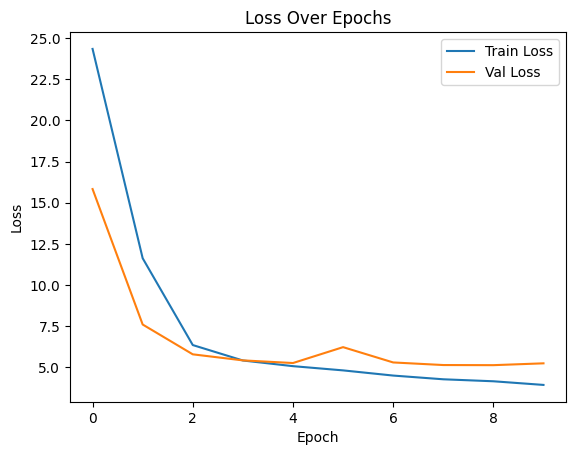

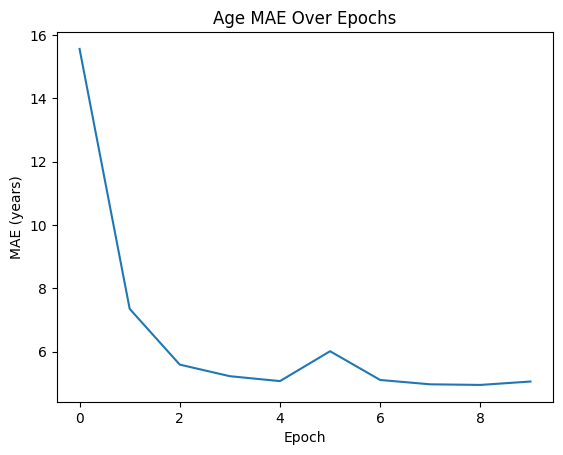

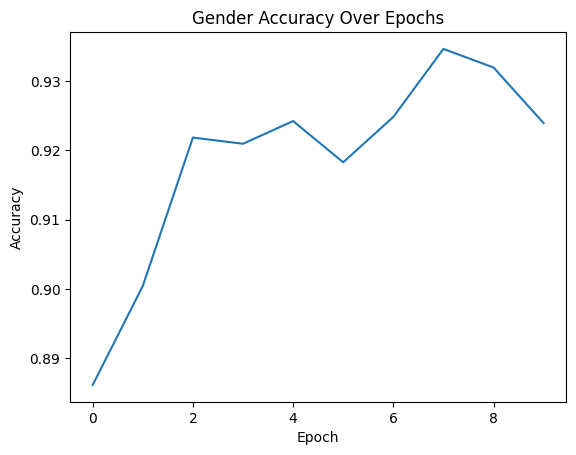

In [39]:
plt.figure()
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(history["val_age_mae"], label="Val Age MAE")
plt.title("Age MAE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.show()

plt.figure()
plt.plot(history["val_gender_acc"], label="Val Gender Acc")
plt.title("Gender Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

We observe an elbow in loss at epoch 2 (quite early). Age MAE plateaus around 2, also relatively soon in the training. However, gender continues to improve as we train more epochs.

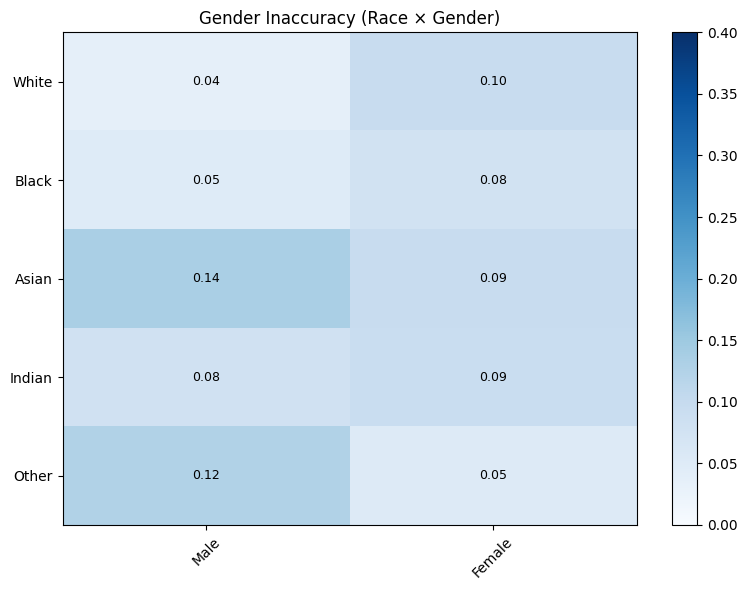

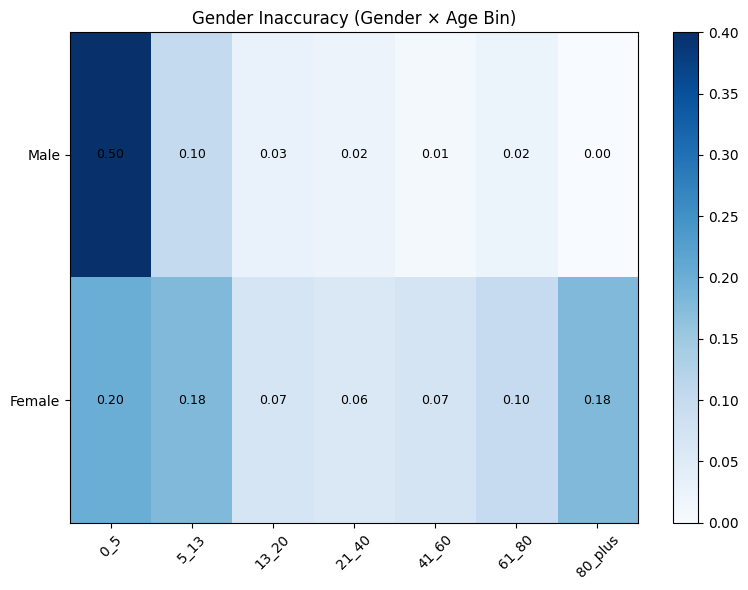

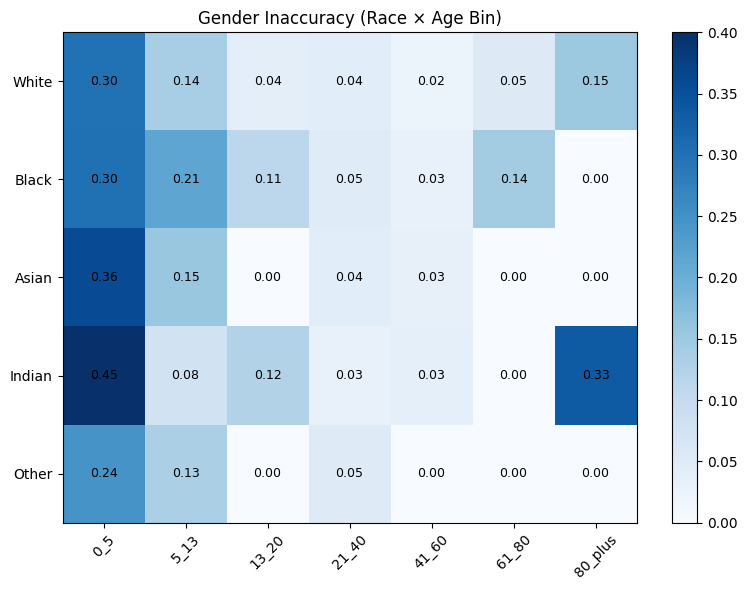

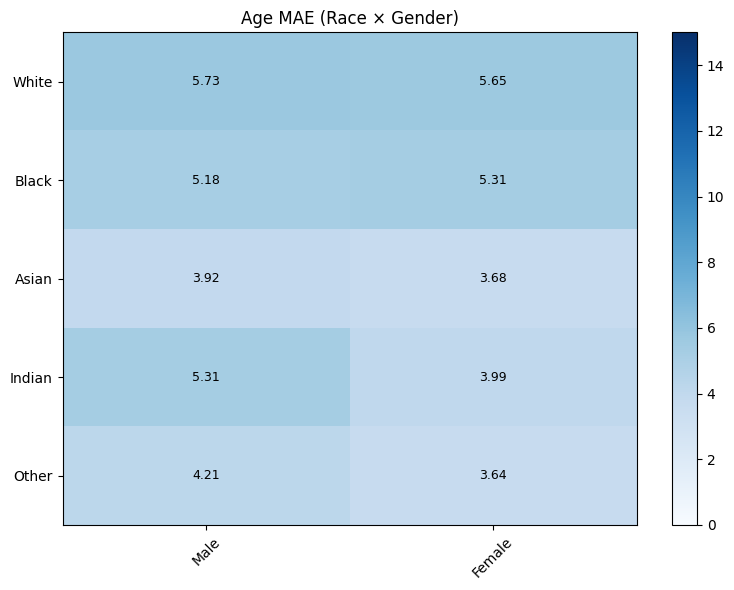

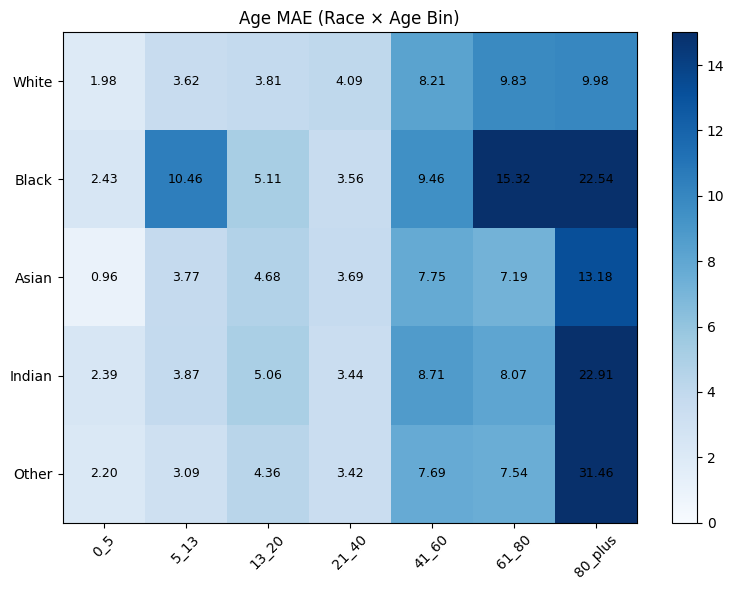

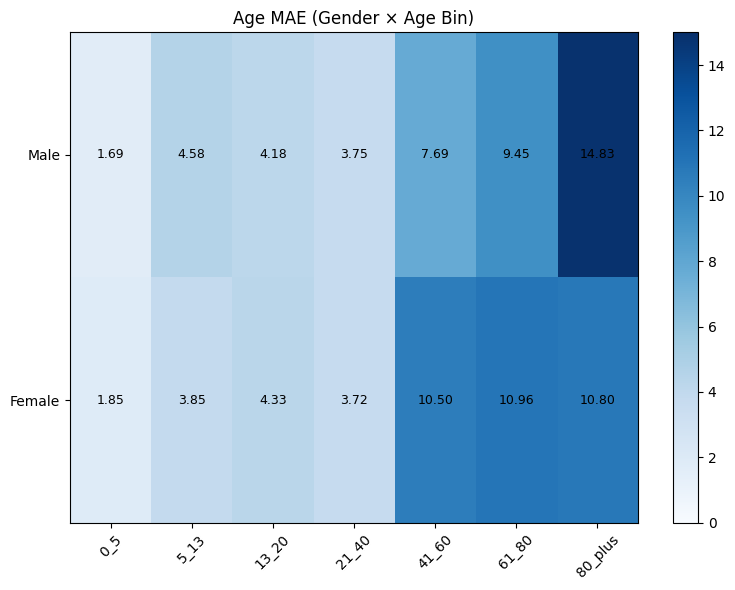

In [40]:
race_map = {
    "0": "White",
    "1": "Black",
    "2": "Asian",
    "3": "Indian",
    "4": "Other"
}

gender_map = {
    "0": "Male",
    "1": "Female"
}

age_order = ["0_5", "5_13", "13_20", "21_40", "41_60", "61_80", "80_plus"]
race_order = ["White", "Black", "Asian", "Indian", "Other"] 
gender_order = ["Male", "Female"]

# =========================================================
# 1. GET TEST PREDICTIONS
# =========================================================

def get_test_predictions(model, loader, device):
    model.eval()
    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            age_pred, gender_logit = model(images)

            gender_prob = torch.sigmoid(gender_logit)
            gender_pred = (gender_prob >= 0.5).float()

            for i in range(len(images)):
                g = str(int(genders[i].item()))
                r = str(races[i])

                results.append({
                    "true_age": ages[i].item(),
                    "pred_age": age_pred[i].item(),
                    "age_error": age_pred[i].item() - ages[i].item(),

                    "true_gender": gender_map[g],
                    "pred_gender": gender_map[str(int(gender_pred[i].item()))],
                    "gender_correct": int(gender_pred[i].item() == genders[i].item()),

                    "race": race_map[r],
                    "age_bin": str(age_bins[i])
                })

    return pd.DataFrame(results)


# =========================================================
# 2. GROUP METRICS 
# =========================================================

def compute_group_metrics(df, group_cols):
    grouped = df.groupby(group_cols)
    out = {}

    for name, sub in grouped:
        out[name] = {
            "gender_acc": sub["gender_correct"].mean(),
            "age_mae": np.abs(sub["age_error"]).mean(),
            "count": len(sub)
        }

    return out


# =========================================================
# 3. CONVERT TO HEATMAP MATRIX
# =========================================================

def to_matrix(metric_dict, row_name, col_name, value_key):
    rows = []

    for k, v in metric_dict.items():
        if not isinstance(k, tuple):
            k = (k,)
        rows.append((*k, v[value_key]))

    df = pd.DataFrame(rows, columns=[row_name, col_name, "value"])
    return df.pivot(index=row_name, columns=col_name, values="value")

def reorder_matrix(matrix, row_order=None, col_order=None):
    if row_order is not None:
        matrix = matrix.reindex(row_order)

    if col_order is not None:
        matrix = matrix.reindex(columns=col_order)

    return matrix
    
# =========================================================
# 4. HEATMAP PLOTTING
# =========================================================

def plot_heatmap(matrix, title, cmap="Blues", vmin=None, vmax=None):

    plt.figure(figsize=(8, 6))

    # use fixed scale if provided
    if vmin is None:
        vmin = np.nanmin(matrix.values)
    if vmax is None:
        vmax = np.nanmax(matrix.values)

    im = plt.imshow(matrix, aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)

    plt.title(title)
    plt.xticks(range(len(matrix.columns)), matrix.columns, rotation=45)
    plt.yticks(range(len(matrix.index)), matrix.index)

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            val = matrix.iloc[i, j]
            if not np.isnan(val):
                plt.text(
                    j, i,
                    f"{val:.2f}",
                    ha="center",
                    va="center",
                    color="black",
                    fontsize=9
                )

    plt.colorbar(im)
    plt.tight_layout()
    plt.show()

# =========================================================
# 5. TEST RESULTS
# =========================================================

test_results_baseline = get_test_predictions(resnet_model, test_loader, device)


# =========================================================
# 6. GET INTERSECTIONS OF GROUPS
# =========================================================

race_gender = compute_group_metrics(test_results_baseline, ["race", "true_gender"])
race_age = compute_group_metrics(test_results_baseline, ["race", "age_bin"])
gender_age = compute_group_metrics(test_results_baseline, ["true_gender", "age_bin"])


# =========================================================
# 7. BUILD MATRICES
# =========================================================

rg_acc = to_matrix(race_gender, "race", "gender", "gender_acc")
rg_mae = to_matrix(race_gender, "race", "gender", "age_mae")

ra_acc = to_matrix(race_age, "race", "age_bin", "gender_acc")
ra_mae = to_matrix(race_age, "race", "age_bin", "age_mae")

ga_acc = to_matrix(gender_age, "true_gender", "age_bin", "gender_acc")
ga_mae = to_matrix(gender_age, "true_gender", "age_bin", "age_mae")

rg_inacc = 1 - rg_acc
ra_inacc = 1 - ra_acc
ga_inacc = 1 - ga_acc

rg_acc = reorder_matrix(rg_acc, race_order, gender_order)
rg_mae = reorder_matrix(rg_mae, race_order, gender_order)
rg_inacc = reorder_matrix(rg_inacc, race_order, gender_order)
ra_acc = reorder_matrix(ra_acc, race_order, age_order)
ra_mae = reorder_matrix(ra_mae, race_order, age_order)
ra_inacc = reorder_matrix(ra_inacc, race_order, age_order)
ga_acc = reorder_matrix(ga_acc, gender_order, age_order)
ga_mae = reorder_matrix(ga_mae, gender_order, age_order)
ga_inacc = reorder_matrix(ga_inacc, gender_order, age_order)

# =========================================================
# 8. PLOTS 
# =========================================================

INACC_VMIN, INACC_VMAX = 0.0, 0.4
MAE_VMIN, MAE_VMAX = 0.0, 15.0

plot_heatmap(rg_inacc, "Gender Inaccuracy (Race × Gender)",
             vmin=INACC_VMIN, vmax=INACC_VMAX)

plot_heatmap(ga_inacc, "Gender Inaccuracy (Gender × Age Bin)",
             vmin=INACC_VMIN, vmax=INACC_VMAX)

plot_heatmap(ra_inacc, "Gender Inaccuracy (Race × Age Bin)",
             vmin=INACC_VMIN, vmax=INACC_VMAX)

plot_heatmap(rg_mae, "Age MAE (Race × Gender)",
             vmin=MAE_VMIN, vmax=MAE_VMAX)

plot_heatmap(ra_mae, "Age MAE (Race × Age Bin)",
             vmin=MAE_VMIN, vmax=MAE_VMAX)

plot_heatmap(ga_mae, "Age MAE (Gender × Age Bin)",
             vmin=MAE_VMIN, vmax=MAE_VMAX)

Gender accuracy generally worse for asians and other, but especially poor for black labeled photos in the 80+ years old bin. The model also has a tough time predicting the genders of children aged 0-5, which makes sense as many people also struggle to tell the difference between genders of kids these ages. 

Older ages are generally harder for the model to accurately predict, this trend is clearly seen in the last figure. The other category intersected with 80+ years old has an especially high MAE.


### EDA with ResNet Embeddings

In [41]:
# embeddings
X = emb_outputs["embeddings"].numpy()

# labels
race = np.array(emb_outputs["race"])
gender = np.array(emb_outputs["gender"])
age_bin = np.array(emb_outputs["age_bin"])

#defines how umap will compress our embeddings
reducer = UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    random_state=42
)

X_umap = reducer.fit_transform(X)

race_map = {
    0: "White",
    1: "Black",
    2: "Asian",
    3: "Indian",
    4: "Other"
}

gender_map = {
    0.0: "Male",
    1.0: "Female"
}

def plot_umap(X_umap, labels, label_map=None, title=""):
    plt.figure(figsize=(7,6))

    labels = np.array(labels)
    try:
        labels = labels.astype(int)
    except:
        pass

    unique_labels = np.unique(labels)

    for lab in unique_labels:
        mask = labels == lab

        name = label_map[lab] if label_map else str(lab)

        plt.scatter(
            X_umap[mask, 0],
            X_umap[mask, 1],
            label=name,
            alpha=0.6
        )

    plt.title(title)
    plt.legend()
    plt.show()

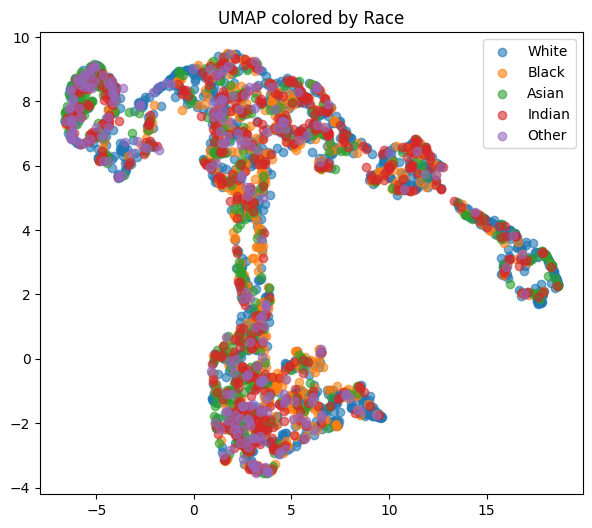

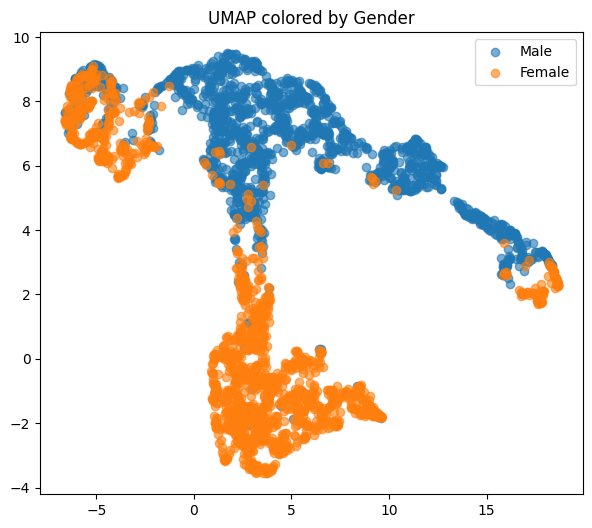

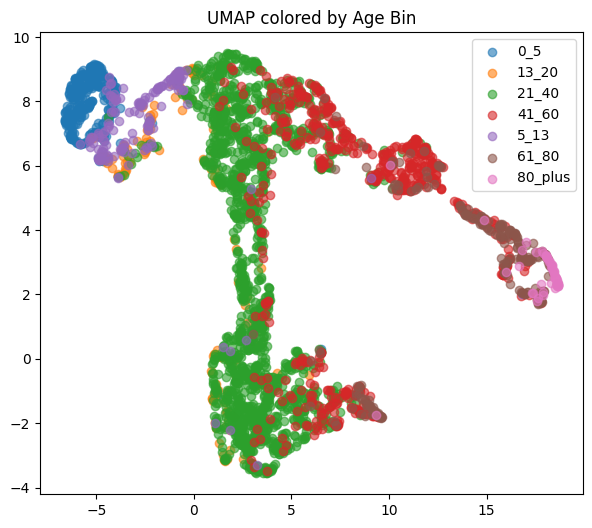

In [42]:
plot_umap(X_umap, race, race_map, "UMAP colored by Race")
plot_umap(X_umap, gender, gender_map, "UMAP colored by Gender")
plot_umap(X_umap, age_bin, None, "UMAP colored by Age Bin")

We see here that the embeddings generated by our ResNet model separate age and gender quite well. Since the model was not initally trained to predict race, it makes sense that the embeddings did not learn this feature. 

### Correction Strategy #1: Intersectional Reweighting of Disproportionately Small Groups

This reweighting method first groups each training sample by its intersection of race, gender, and age bin, then counts how frequently each group appears in the dataset. It assigns each sample a weight equal to the inverse of its group frequency, so rarer groups receive higher weights and common groups receive lower weights. The WeightedRandomSampler uses these weights to sample training examples with replacement, meaning minority groups are drawn more often within each epoch. As a result, the model sees a more balanced distribution of demographic subgroups during training, which should reduce bias toward overrepresented groups.

In [43]:
#UPSAMPLING RARE RACE AND GENDER COMBINATIONS
race = train_df["race"].astype(str).values
gender = train_df["gender"].astype(str).values
age_bin = train_df["eval_age_bin"].astype(str).values
groups = race + "_" + gender + "_" + age_bin

unique_groups, counts = np.unique(groups, return_counts=True)
group_freq = dict(zip(unique_groups, counts))

# weight = 1 / frequency
sample_weights = np.array([1.0 / group_freq[g] for g in groups])
sample_weights = sample_weights / sample_weights.sum() #normalize

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True,
    generator=g  # <-- changed for seed
)

# dataloaders
train_dataset = UTKFaceDataset(train_df, transform=train_transform)
val_dataset = UTKFaceDataset(val_df, transform=val_transform)
test_dataset = UTKFaceDataset(test_df, transform=test_transform)

train_loader = DataLoader( #TRAIN LOADER CHANGED FOR UPSAMPLING
    train_dataset,
    batch_size=64,
    sampler=sampler,
    worker_init_fn=seed_worker, #changed for seed
    generator=g,
    num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=0, worker_init_fn=seed_worker, generator=g)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
set_seed(42)

resnet_model = MultiTaskResNet().to(device)

age_criterion = nn.L1Loss()
gender_criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(resnet_model.parameters(), lr=1e-4)

num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")
best_gender_acc = 0.0

start_time = time.time()


# =========================
# TRAINING LOOP
# =========================
print("Starting training loop...")
for epoch in range(num_epochs):
    print("Epoch started")

    # ---- train ----
    train_metrics = train_one_epoch(
        resnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    # ---- validate ----
    val_metrics = evaluate(
        resnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    # ---- log history ----
    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    # ---- save best model ----
    if (val_metrics["age_mae"] < best_val_mae or
        (abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
         val_metrics["gender_acc"] > best_gender_acc)):

        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]

        torch.save(resnet_model.state_dict(), "best_reweighted_resnet.pt")
        print("  → Saved new best model")


# =========================
# SAVE FINAL MODEL + HISTORY
# =========================
torch.save({
    "model_state": resnet_model.state_dict(),
    "history": history,
    "config": {
        "img_size": IMG_SIZE
    }
}, "resnet_reweighted_checkpoint.pt")


end_time = time.time()
print(f"\nTraining time: {(end_time - start_time)/60:.2f} minutes")


# =========================
# EMBEDDINGS EXTRACTION
# =========================
outputs = extract_embeddings(resnet_model, test_loader, device)

# save embeddings
np.save("test_embeddings_reweighted.npy", outputs["embeddings"].numpy())
print('Done Training')

Starting training loop...
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:09<00:00,  3.56it/s]


Epoch 01 | Train Loss: 28.4188 | Val Loss: 16.4150 | Age MAE: 16.11 | Gender Acc: 0.878
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:04<00:00,  3.84it/s]


Epoch 02 | Train Loss: 15.8632 | Val Loss: 6.9131 | Age MAE: 6.67 | Gender Acc: 0.903
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:08<00:00,  3.60it/s]


Epoch 03 | Train Loss: 6.6110 | Val Loss: 6.6184 | Age MAE: 6.39 | Gender Acc: 0.905
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:28<00:00,  2.78it/s]


Epoch 04 | Train Loss: 4.9428 | Val Loss: 6.2316 | Age MAE: 6.04 | Gender Acc: 0.925
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:15<00:00,  3.24it/s]


Epoch 05 | Train Loss: 4.3190 | Val Loss: 6.2939 | Age MAE: 6.09 | Gender Acc: 0.922
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:14<00:00,  3.28it/s]


Epoch 06 | Train Loss: 4.3082 | Val Loss: 5.6806 | Age MAE: 5.48 | Gender Acc: 0.921
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:12<00:00,  3.38it/s]


Epoch 07 | Train Loss: 3.8980 | Val Loss: 5.8196 | Age MAE: 5.63 | Gender Acc: 0.927
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:15<00:00,  3.25it/s]


Epoch 08 | Train Loss: 3.7205 | Val Loss: 6.1350 | Age MAE: 5.94 | Gender Acc: 0.927
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:38<00:00,  2.50it/s]


Epoch 09 | Train Loss: 3.3093 | Val Loss: 5.5879 | Age MAE: 5.40 | Gender Acc: 0.930
  → Saved new best model
Epoch started


Training: 100%|██████████████████████████████████████████████████████████████████████| 246/246 [01:37<00:00,  2.53it/s]


Epoch 10 | Train Loss: 3.0378 | Val Loss: 5.6714 | Age MAE: 5.48 | Gender Acc: 0.924

Training time: 15.45 minutes
Done Training


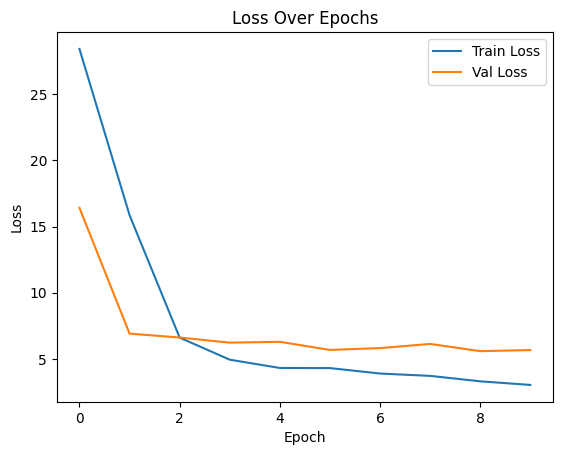

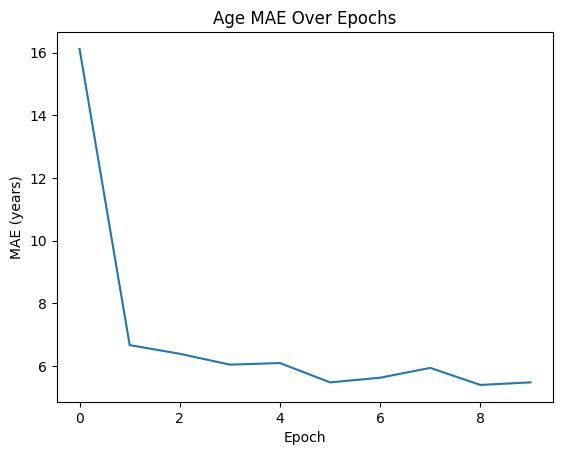

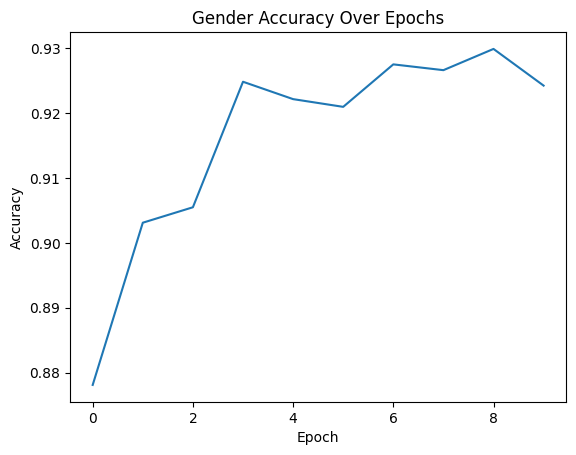

In [44]:
plt.figure()
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(history["val_age_mae"], label="Val Age MAE")
plt.title("Age MAE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.show()

plt.figure()
plt.plot(history["val_gender_acc"], label="Val Gender Acc")
plt.title("Gender Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

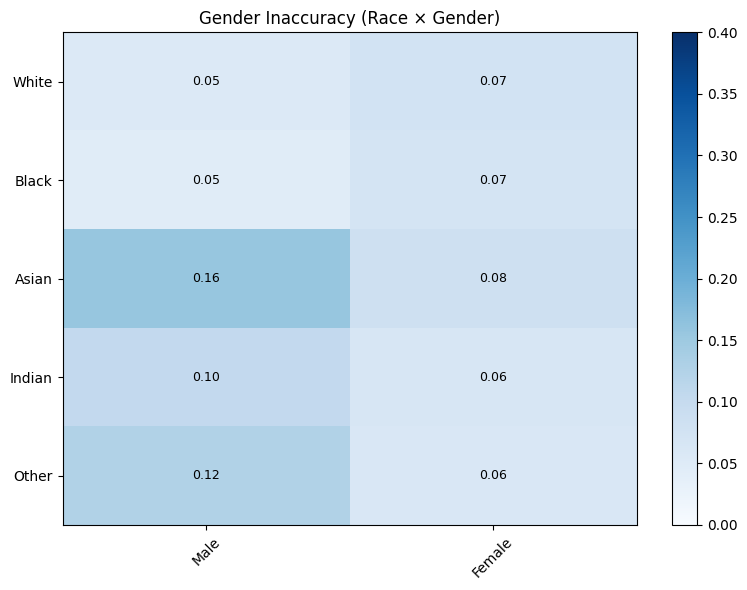

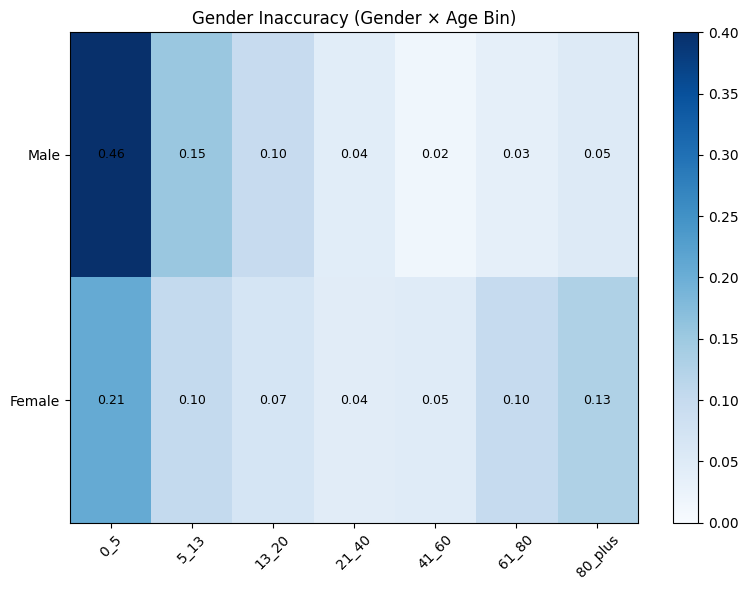

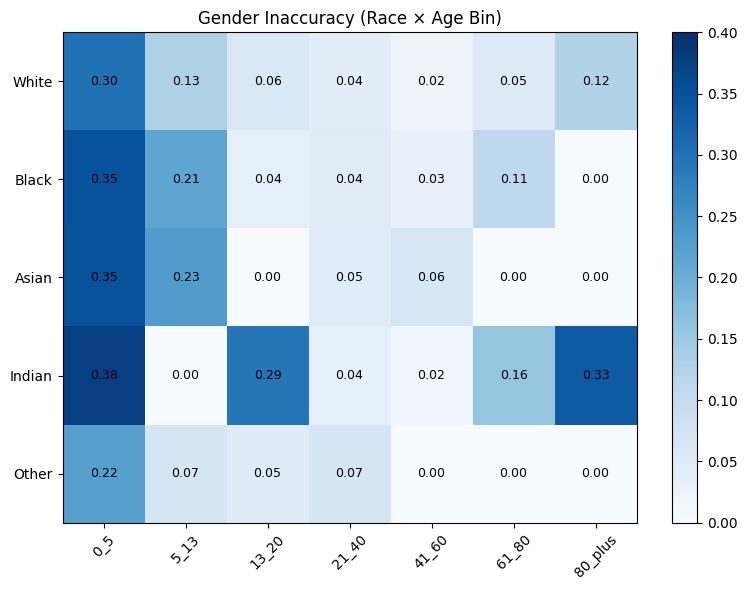

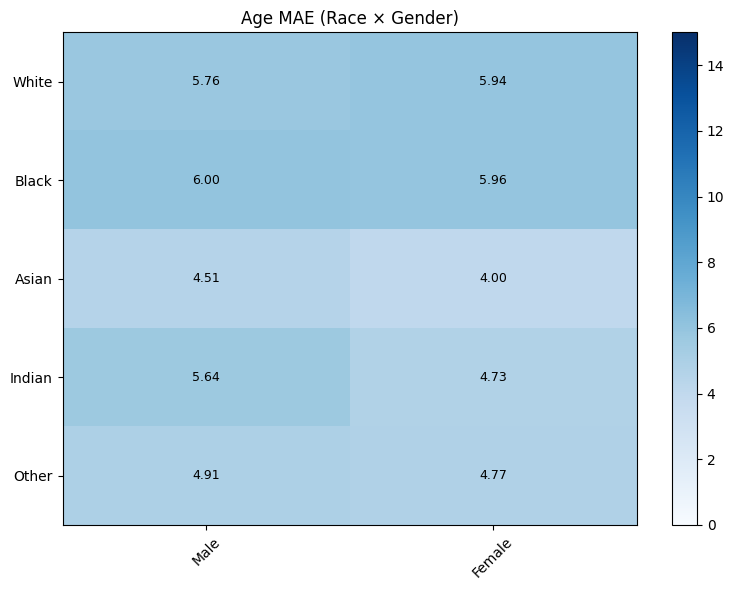

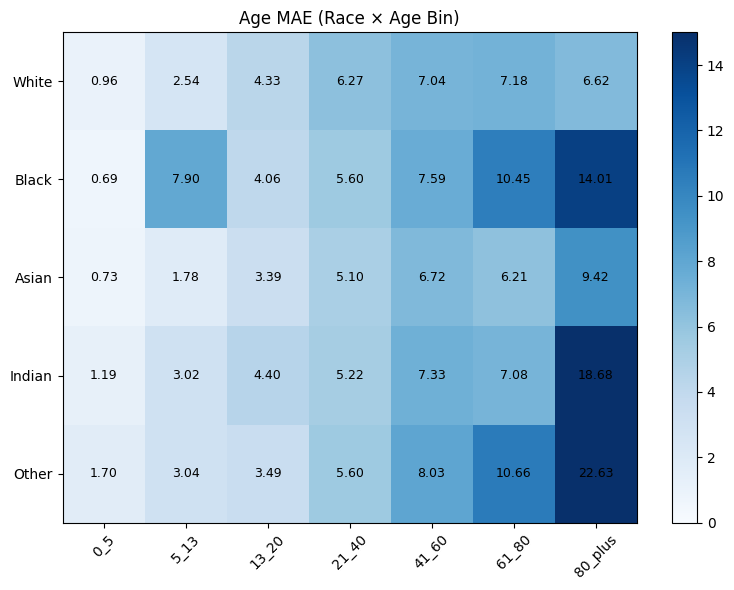

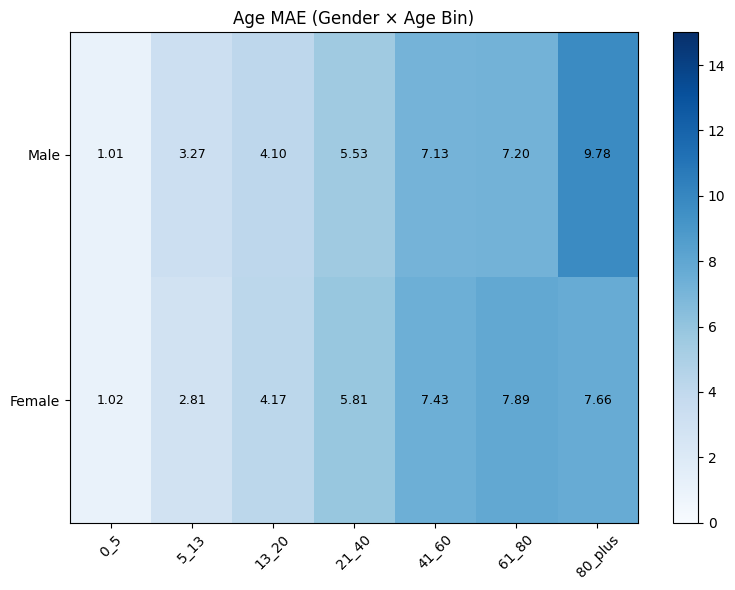

In [45]:
def get_test_predictions(model, loader, device):
    model.eval()
    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            age_pred, gender_logit = model(images)

            gender_prob = torch.sigmoid(gender_logit)
            gender_pred = (gender_prob >= 0.5).float()

            for i in range(len(images)):
                g = int(genders[i].item())
                p = int(gender_pred[i].item())
                r = int(races[i])
                
                results.append({
                    "true_age": ages[i].item(),
                    "pred_age": age_pred[i].item(),
                    "age_error": age_pred[i].item() - ages[i].item(),
                
                    "true_gender": gender_map[g],
                    "pred_gender": gender_map[p],
                    "gender_correct": int(p == g),
                
                    "race": race_map[r],
                    "age_bin": str(age_bins[i])
                })

    return pd.DataFrame(results)
    
test_results_reweighted = get_test_predictions(resnet_model, test_loader, device)
gender_map = {
    0: "Male",
    1: "Female"
}

# =========================================================
# COMPUTE INTERSECTIONAL GROUPS
# =========================================================

race_gender = compute_group_metrics(test_results_reweighted, ["race", "true_gender"])
race_age = compute_group_metrics(test_results_reweighted, ["race", "age_bin"])
gender_age = compute_group_metrics(test_results_reweighted, ["true_gender", "age_bin"])


# =========================================================
# BUILD MATRICES
# =========================================================

rg_acc = to_matrix(race_gender, "race", "gender", "gender_acc")
rg_mae = to_matrix(race_gender, "race", "gender", "age_mae")

ra_acc = to_matrix(race_age, "race", "age_bin", "gender_acc")
ra_mae = to_matrix(race_age, "race", "age_bin", "age_mae")

ga_acc = to_matrix(gender_age, "true_gender", "age_bin", "gender_acc")
ga_mae = to_matrix(gender_age, "true_gender", "age_bin", "age_mae")

rg_inacc = 1 - rg_acc
ra_inacc = 1 - ra_acc
ga_inacc = 1 - ga_acc

rg_acc = reorder_matrix(rg_acc, race_order, gender_order)
rg_mae = reorder_matrix(rg_mae, race_order, gender_order)
rg_inacc = reorder_matrix(rg_inacc, race_order, gender_order)
ra_acc = reorder_matrix(ra_acc, race_order, age_order)
ra_mae = reorder_matrix(ra_mae, race_order, age_order)
ra_inacc = reorder_matrix(ra_inacc, race_order, age_order)
ga_acc = reorder_matrix(ga_acc, gender_order, age_order)
ga_mae = reorder_matrix(ga_mae, gender_order, age_order)
ga_inacc = reorder_matrix(ga_inacc, gender_order, age_order)

# =========================================================
# PLOTS 
# =========================================================

INACC_VMIN, INACC_VMAX = 0.0, 0.4
MAE_VMIN, MAE_VMAX = 0.0, 15.0

plot_heatmap(
    rg_inacc,
    "Gender Inaccuracy (Race × Gender)",
    vmin=INACC_VMIN,
    vmax=INACC_VMAX
)

plot_heatmap(
    ga_inacc,
    "Gender Inaccuracy (Gender × Age Bin)",
    vmin=INACC_VMIN,
    vmax=INACC_VMAX
)

plot_heatmap(
    ra_inacc,
    "Gender Inaccuracy (Race × Age Bin)",
    vmin=INACC_VMIN,
    vmax=INACC_VMAX)

plot_heatmap(
    rg_mae,
    "Age MAE (Race × Gender)",
    vmin=MAE_VMIN,
    vmax=MAE_VMAX
)

plot_heatmap(
    ra_mae,
    "Age MAE (Race × Age Bin)",
    vmin=MAE_VMIN,
    vmax=MAE_VMAX
)

plot_heatmap(
    ga_mae,
    "Age MAE (Gender × Age Bin)",
    vmin=MAE_VMIN,
    vmax=MAE_VMAX
)

The reweighting appears to have slightly helped with bias, smoothing out the heat map and reducing error/inaccuracy of the worst groups by a little bit.

### Correction Strategy #2: Thresholding

In order to implement some of the correction methods we ideated, we need to be able to adjust the model's thresholding by race. To do that, we must allow the model to access the racial information of each image, which we didn't do in our first pass model. Here, we use the same ResNet18 model but add a new classifier head that predicts race (this is working under the assumption that when models are fed images, they are not explicitly told the race of the person in the image). This way, we can optimize race prediction in a supervised manner, which in turn trains the model's ability to make an informed decision about which gender/age prediction threshold to use in the final classification layer.

In [46]:
labels = ["0_5",      # infants / toddlers
          "5_13",     # children
          "13_20",    # teens
          "21_40",
          "41_60",
          "61_80",
          "80_plus"
]

df["eval_age_bin"] = pd.cut(
    df["age"],
    bins=[0, 5, 13, 20, 40, 60, 80, 120],
    labels=["0_5", "5_13", "13_20", "21_40", "41_60", "61_80", "80_plus"],
    include_lowest=True
)

race_map = {
    0: "White",
    1: "Black",
    2: "Asian",
    3: "Indian",
    4: "Other"
}

gender_map = {
    0: "Male",
    1: "Female"
}

IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

### Define and train the 3-head model.

In [47]:
class MultiTaskResNet(nn.Module):
    def __init__(self, num_races=5):
        super().__init__()

        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.age_head = nn.Linear(in_features, 1)      
        self.gender_head = nn.Linear(in_features, 1)    
        self.race_head = nn.Linear(in_features, num_races)     

    def forward(self, x):
        features = self.backbone(x)

        age_pred = self.age_head(features).squeeze(1)
        gender_logit = self.gender_head(features).squeeze(1)
        race_logits = self.race_head(features)

        return age_pred, gender_logit, race_logits

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet_model = MultiTaskResNet(num_races=5).to(device)

age_criterion = nn.L1Loss()
gender_criterion = nn.BCEWithLogitsLoss()
race_criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(resnet_model.parameters(), lr=1e-4)


def train_one_epoch(model, loader, optimizer, age_criterion, gender_criterion, race_criterion, device):
    model.train()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0
    total_race_loss = 0.0

    for images, ages, genders, races, _ in loader:
        images = images.to(device)
        ages = ages.to(device)
        genders = genders.to(device)
        races = races.to(device)

        optimizer.zero_grad()

        age_pred, gender_logit, race_logits = model(images)

        age_loss = age_criterion(age_pred, ages)
        gender_loss = gender_criterion(gender_logit, genders)
        race_loss = race_criterion(race_logits, races)

        loss = age_loss + gender_loss + race_loss
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        total_age_loss += age_loss.item() * images.size(0)
        total_gender_loss += gender_loss.item() * images.size(0)
        total_race_loss += race_loss.item() * images.size(0)

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n,
        "race_loss": total_race_loss / n
    }


def evaluate(model, loader, age_criterion, gender_criterion, race_criterion, device):
    model.eval()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0
    total_race_loss = 0.0

    all_age_preds = []
    all_ages = []
    all_gender_preds = []
    all_genders = []
    all_race_preds = []
    all_races = []

    with torch.no_grad():
        for images, ages, genders, races, _ in loader:
            images = images.to(device)
            ages = ages.to(device)
            genders = genders.to(device)
            races = races.to(device)

            age_pred, gender_logit, race_logits = model(images)

            age_loss = age_criterion(age_pred, ages)
            gender_loss = gender_criterion(gender_logit, genders)
            race_loss = race_criterion(race_logits, races)

            loss = age_loss + gender_loss + race_loss

            total_loss += loss.item() * images.size(0)
            total_age_loss += age_loss.item() * images.size(0)
            total_gender_loss += gender_loss.item() * images.size(0)
            total_race_loss += race_loss.item() * images.size(0)

            gender_probs = torch.sigmoid(gender_logit)
            gender_preds = (gender_probs >= 0.5).float()

            race_preds = torch.argmax(race_logits, dim=1)

            all_age_preds.append(age_pred.cpu())
            all_ages.append(ages.cpu())
            all_gender_preds.append(gender_preds.cpu())
            all_genders.append(genders.cpu())
            all_race_preds.append(race_preds.cpu())
            all_races.append(races.cpu())

    all_age_preds = torch.cat(all_age_preds)
    all_ages = torch.cat(all_ages)
    all_gender_preds = torch.cat(all_gender_preds)
    all_genders = torch.cat(all_genders)
    all_race_preds = torch.cat(all_race_preds)
    all_races = torch.cat(all_races)

    age_mae = torch.mean(torch.abs(all_age_preds - all_ages)).item()
    gender_acc = (all_gender_preds == all_genders).float().mean().item()
    race_acc = (all_race_preds == all_races).float().mean().item()

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n,
        "race_loss": total_race_loss / n,
        "age_mae": age_mae,
        "gender_acc": gender_acc,
        "race_acc": race_acc
    }

In [48]:
class UTKFaceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image = row["image"]

        if self.transform:
            image = self.transform(image)

        age = torch.tensor(row["age"], dtype=torch.float32)
        gender = torch.tensor(row["gender"], dtype=torch.float32)

        race = torch.tensor(row["race"], dtype=torch.long) 
        age_bin = str(row["eval_age_bin"])

        return image, age, gender, race, age_bin


df["stratify_key"] = (
    df["race"].astype(str) + "_" +
    df["gender"].astype(str)
)

train_df, temp_df = train_test_split(
    df,
    test_size=0.30,
    random_state=42,
    stratify=df["stratify_key"]
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["stratify_key"]
)

print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


train_dataset = UTKFaceDataset(train_df, transform=train_transform)
val_dataset = UTKFaceDataset(val_df, transform=val_transform)
test_dataset = UTKFaceDataset(test_df, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=0)


Train size: 15697
Validation size: 3364
Test size: 3364


In [49]:
num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": [],
    "val_race_acc": []
}

best_val_mae = float("inf")
best_gender_acc = 0.0

start_time = time.time()

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(
        resnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, race_criterion, device
    )

    val_metrics = evaluate(
        resnet_model, val_loader,
        age_criterion, gender_criterion, race_criterion, device
    )

    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])
    history["val_race_acc"].append(val_metrics["race_acc"])

    print(
        f"Epoch {epoch+1:02d} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Age MAE: {val_metrics['age_mae']:.2f} | "
        f"Gender Acc: {val_metrics['gender_acc']:.3f} | "
        f"Race Acc: {val_metrics['race_acc']:.3f}"
    )

    if (
        val_metrics["age_mae"] < best_val_mae or
        (
            abs(val_metrics["age_mae"] - best_val_mae) < 1e-4
            and val_metrics["gender_acc"] > best_gender_acc
        )
    ):
        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]
        torch.save({
            "model_state_dict": resnet_model.state_dict(),
            "model_type": "resnet_3head",
            "val_mae": best_val_mae
        }, "best_resnet_3head.pt")        
        print("  → Saved new best model")

end_time = time.time()
total_time = end_time - start_time
print(f"\nTotal training time: {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

Epoch 01 | Train Loss: 25.5296 | Val Loss: 17.1901 | Age MAE: 16.25 | Gender Acc: 0.897 | Race Acc: 0.779
  → Saved new best model
Epoch 02 | Train Loss: 11.8208 | Val Loss: 8.0567 | Age MAE: 7.20 | Gender Acc: 0.903 | Race Acc: 0.801
  → Saved new best model
Epoch 03 | Train Loss: 6.6615 | Val Loss: 6.6774 | Age MAE: 5.88 | Gender Acc: 0.889 | Race Acc: 0.818
  → Saved new best model
Epoch 04 | Train Loss: 5.9039 | Val Loss: 6.1723 | Age MAE: 5.45 | Gender Acc: 0.925 | Race Acc: 0.815
  → Saved new best model
Epoch 05 | Train Loss: 5.3143 | Val Loss: 5.9496 | Age MAE: 5.26 | Gender Acc: 0.928 | Race Acc: 0.833
  → Saved new best model
Epoch 06 | Train Loss: 5.0846 | Val Loss: 5.7268 | Age MAE: 5.08 | Gender Acc: 0.933 | Race Acc: 0.843
  → Saved new best model
Epoch 07 | Train Loss: 4.8386 | Val Loss: 5.6452 | Age MAE: 4.95 | Gender Acc: 0.929 | Race Acc: 0.826
  → Saved new best model
Epoch 08 | Train Loss: 4.5559 | Val Loss: 5.5725 | Age MAE: 4.90 | Gender Acc: 0.933 | Race Acc: 0.8

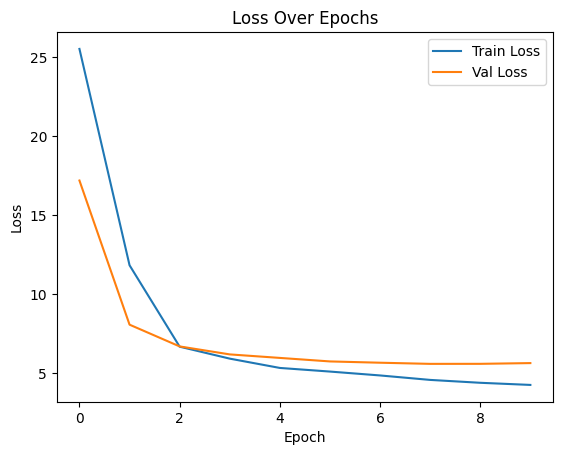

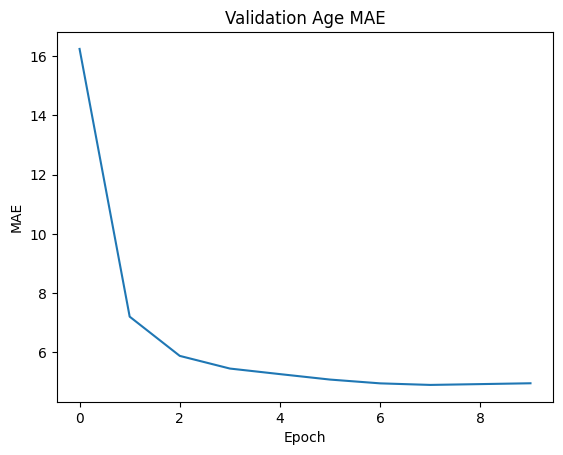

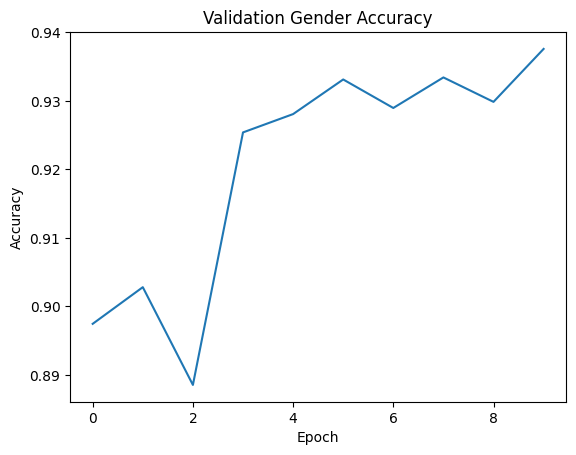

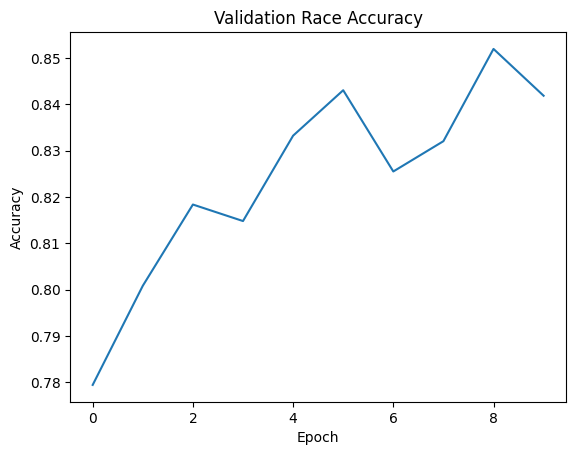

In [50]:
plt.figure()
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(history["val_age_mae"])
plt.title("Validation Age MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.show()

plt.figure()
plt.plot(history["val_gender_acc"])
plt.title("Validation Gender Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

plt.figure()
plt.plot(history["val_race_acc"])
plt.title("Validation Race Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

## Thresholding (FINE TUNING)

In [51]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet_model = MultiTaskResNet(num_races=5).to(device)

checkpoint = torch.load("best_resnet_3head.pt", map_location=device)
resnet_model.load_state_dict(checkpoint["model_state_dict"])
# resnet_model.eval()

<All keys matched successfully>

In [52]:
def get_predictions_for_thresholding(model, loader, device):
    model.eval()
    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            age_pred, gender_logit, race_logits = model(images)

            gender_prob = torch.sigmoid(gender_logit)
            gender_pred = (gender_prob >= 0.5).float()
            pred_race = torch.argmax(race_logits, dim=1)

            for i in range(len(images)):
                true_gender_num = int(genders[i].item())
                pred_gender_num = int(gender_pred[i].item())

                true_race_num = int(races[i].item())
                pred_race_num = int(pred_race[i].item())

                results.append({
                    "true_age": float(ages[i].item()),
                    "pred_age": float(age_pred[i].item()),
                    "age_error": float(age_pred[i].item() - ages[i].item()),
                    
                    "true_gender_num": true_gender_num,  # number
                    "pred_gender_num": pred_gender_num,
                    "true_gender": gender_map[true_gender_num],   # string
                    "pred_gender": gender_map[pred_gender_num],
                    "gender_prob": float(gender_prob[i].item()),
                    "gender_correct": int(pred_gender_num == true_gender_num),

                    "true_race_num": true_race_num,
                    "pred_race_num": pred_race_num,
                    "true_race": race_map[true_race_num],
                    "pred_race": race_map[pred_race_num],

                    "age_bin": str(age_bins[i])
                })

    return pd.DataFrame(results)

In [53]:
def choose_thresholds_by_predicted_race(val_results, min_count=20, max_dev=0.25):
    low = 0.5 - max_dev
    high = 0.5 + max_dev
    threshold_grid = np.linspace(low, high, 61)

    thresholds = {}

    for race_id in sorted(val_results["pred_race_num"].unique()):
        subset = val_results[val_results["pred_race_num"] == race_id].copy()

        if len(subset) < min_count:
            thresholds[race_id] = 0.5
            continue

        best_threshold = 0.5
        best_acc = -1.0

        for t in threshold_grid:
            preds = (subset["gender_prob"] >= t).astype(int)
            acc = (preds == subset["true_gender_num"]).mean()

            if acc > best_acc:
                best_acc = acc
                best_threshold = float(t)

        thresholds[race_id] = best_threshold

    return thresholds

In [54]:
def apply_race_specific_gender_thresholds(results_df, thresholds):
    out = results_df.copy()

    out["gender_threshold"] = out["pred_race_num"].map(thresholds).fillna(0.5)

    out["pred_gender_adjusted"] = (
        out["gender_prob"] >= out["gender_threshold"]
    ).astype(int)

    out["gender_correct_adjusted"] = (
        out["pred_gender_adjusted"] == out["true_gender_num"]
    ).astype(int)

    return out

In [55]:
val_results = get_predictions_for_thresholding(resnet_model, val_loader, device)
thresholds = choose_thresholds_by_predicted_race(val_results)

print("Thresholds:", thresholds)

test_results_default = get_predictions_for_thresholding(resnet_model, test_loader, device)
test_results_adjusted = apply_race_specific_gender_thresholds(
    test_results_default.copy(),
    thresholds
)

Thresholds: {np.int64(0): 0.6333333333333333, np.int64(1): 0.7333333333333334, np.int64(2): 0.5666666666666667, np.int64(3): 0.43333333333333335, np.int64(4): 0.5583333333333333}


In [56]:
age_order = ["0_5", "5_13", "13_20", "21_40", "41_60", "61_80", "80_plus"]
race_order = ["White", "Black", "Asian", "Indian", "Other"] 
gender_order = ["Male", "Female"]

def compute_heatmap_group_metrics(df, group_cols, gender_correct_col):
    grouped = df.groupby(group_cols)
    out = {}

    for name, sub in grouped:
        out[name] = {
            "gender_acc": sub[gender_correct_col].mean(),
            "age_mae": np.abs(sub["age_error"]).mean(),
            "count": len(sub)
        }

    return out

def to_matrix(metric_dict, row_name, col_name, value_key):
    rows = []

    for k, v in metric_dict.items():
        if not isinstance(k, tuple):
            k = (k,)
        rows.append((*k, v[value_key]))

    df = pd.DataFrame(rows, columns=[row_name, col_name, "value"])
    return df.pivot(index=row_name, columns=col_name, values="value")

def reorder_matrix(matrix, row_order=None, col_order=None):
    if row_order is not None:
        matrix = matrix.reindex(row_order)

    if col_order is not None:
        matrix = matrix.reindex(columns=col_order)

    return matrix

def plot_heatmap(matrix, title, cmap="Blues", fmt=".2f", vmin=None, vmax=None):
    plt.figure(figsize=(8, 6))

    if vmin is None:
        vmin = np.nanmin(matrix.values)
    if vmax is None:
        vmax = np.nanmax(matrix.values)

    im = plt.imshow(matrix, aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)

    plt.title(title)
    plt.xticks(range(len(matrix.columns)), matrix.columns, rotation=45)
    plt.yticks(range(len(matrix.index)), matrix.index)

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            val = matrix.iloc[i, j]
            if not np.isnan(val):
                plt.text(
                    j, i,
                    format(val, fmt),
                    ha="center",
                    va="center",
                    color="black",
                    fontsize=9
                )

    plt.colorbar(im)
    plt.tight_layout()
    plt.show()

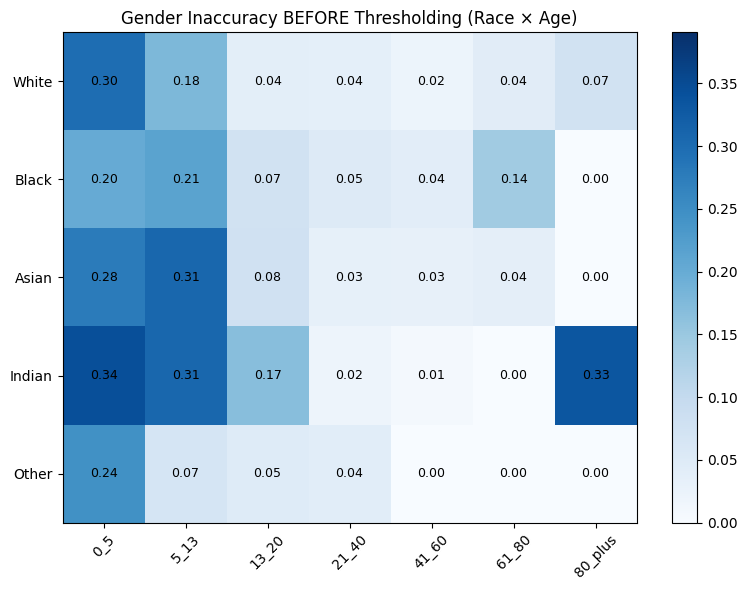

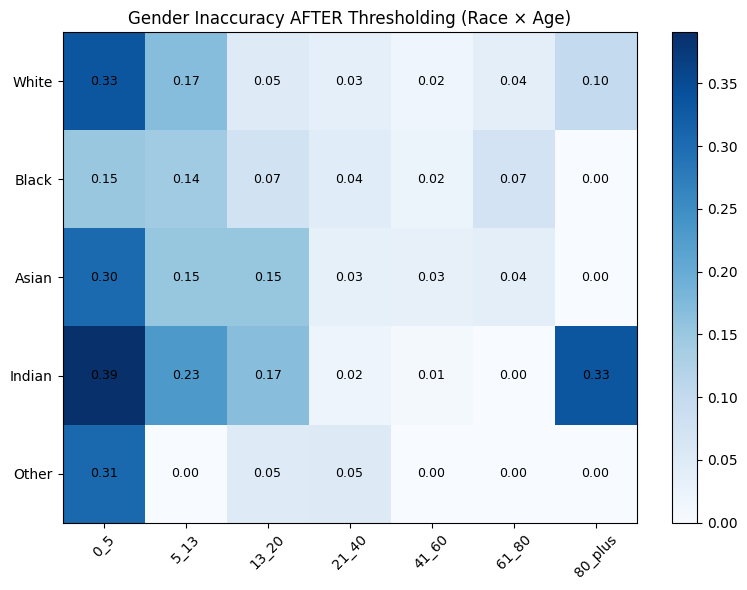

In [57]:
race_age_default = compute_heatmap_group_metrics(
    test_results_default,
    ["true_race", "age_bin"],
    gender_correct_col="gender_correct"
)

ra_acc_default = to_matrix(race_age_default, "race", "age_bin", "gender_acc")
ra_mae_default = to_matrix(race_age_default, "race", "age_bin", "age_mae")

ra_inacc_default = 1 - ra_acc_default

ra_acc_default = reorder_matrix(ra_acc_default, race_order, age_order)
ra_mae_default = reorder_matrix(ra_mae_default, race_order, age_order)
ra_inacc_default = reorder_matrix(ra_inacc_default, race_order, age_order)

# thresholded
race_age_adjusted = compute_heatmap_group_metrics(
    test_results_adjusted,
    ["true_race", "age_bin"],
    gender_correct_col="gender_correct_adjusted"
)

ra_acc_adjusted = to_matrix(race_age_adjusted, "race", "age_bin", "gender_acc")
ra_mae_adjusted = to_matrix(race_age_adjusted, "race", "age_bin", "age_mae")

ra_inacc_adjusted = 1 - ra_acc_adjusted

ra_acc_adjusted = reorder_matrix(ra_acc_adjusted, race_order, age_order)
ra_mae_adjusted = reorder_matrix(ra_mae_adjusted, race_order, age_order)
ra_inacc_adjusted = reorder_matrix(ra_inacc_adjusted, race_order, age_order)

#plot
vmin = min(ra_inacc_default.min().min(), ra_inacc_adjusted.min().min())
vmax = max(ra_inacc_default.max().max(), ra_inacc_adjusted.max().max())

plot_heatmap(
    ra_inacc_default,
    "Gender Inaccuracy BEFORE Thresholding (Race × Age)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

plot_heatmap(
    ra_inacc_adjusted,
    "Gender Inaccuracy AFTER Thresholding (Race × Age)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

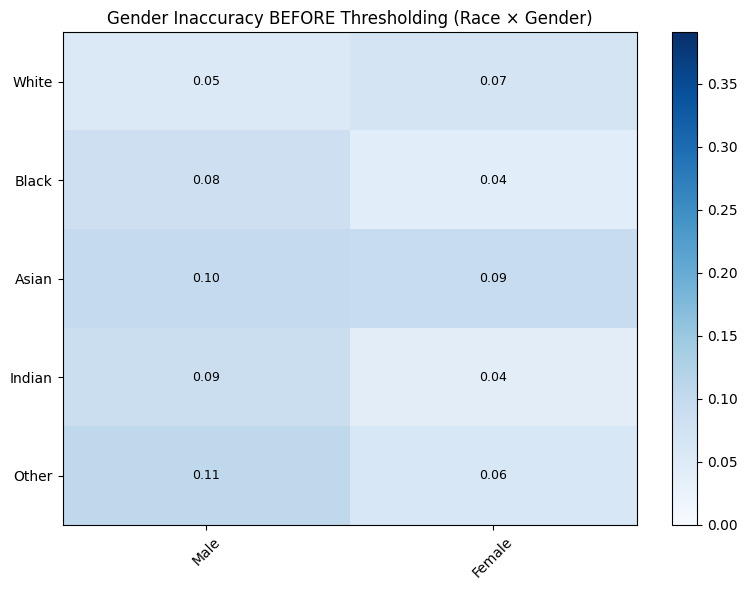

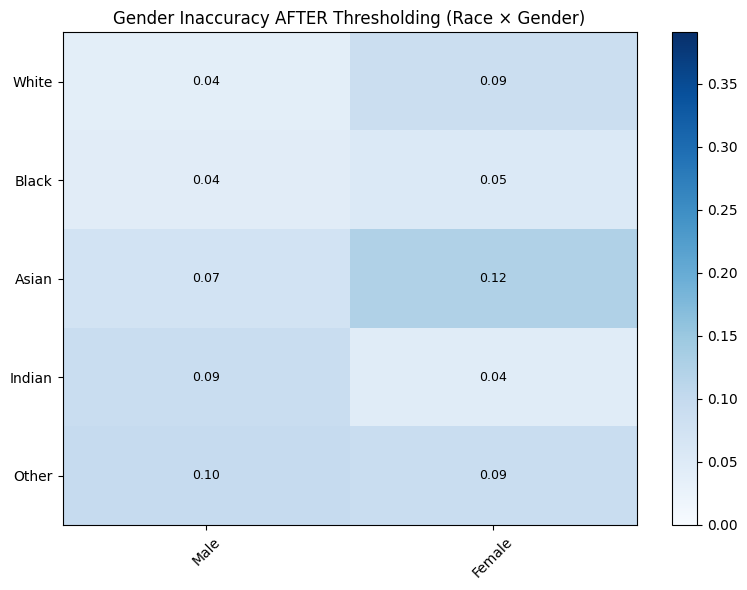

In [58]:
race_gender_default = compute_heatmap_group_metrics(
    test_results_default,
    ["true_race", "true_gender"],
    gender_correct_col="gender_correct"
)

rg_acc_default = to_matrix(race_gender_default, "race", "gender", "gender_acc")
rg_mae_default = to_matrix(race_gender_default, "race", "gender", "age_mae")
rg_inacc_default = 1 - rg_acc_default

rg_acc_default = reorder_matrix(rg_acc_default, race_order, gender_order)
rg_mae_default = reorder_matrix(rg_mae_default, race_order, gender_order)
rg_inacc_default = reorder_matrix(rg_inacc_default, race_order, gender_order)

#thresholded
race_gender_adjusted = compute_heatmap_group_metrics(
    test_results_adjusted,
    ["true_race", "true_gender"],
    gender_correct_col="gender_correct_adjusted"
)

rg_acc_adjusted = to_matrix(race_gender_adjusted, "race", "gender", "gender_acc")
rg_mae_adjusted = to_matrix(race_gender_adjusted, "race", "gender", "age_mae")
rg_inacc_adjusted = 1 - rg_acc_adjusted

rg_acc_adjusted = reorder_matrix(rg_acc_adjusted, race_order, gender_order)
rg_mae_adjusted = reorder_matrix(rg_mae_adjusted, race_order, gender_order)
rg_inacc_adjusted = reorder_matrix(rg_inacc_adjusted, race_order, gender_order)

#plot
vmin = min(rg_inacc_default.min().min(), ra_inacc_adjusted.min().min())
vmax = max(rg_inacc_default.max().max(), ra_inacc_adjusted.max().max())

plot_heatmap(
    rg_inacc_default,
    "Gender Inaccuracy BEFORE Thresholding (Race × Gender)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

plot_heatmap(
    rg_inacc_adjusted,
    "Gender Inaccuracy AFTER Thresholding (Race × Gender)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

# plot_heatmap(
#     rg_mae_default,
#     "Age MAE BEFORE Thresholding (Race × Gender)",
#     cmap="Reds"
# )

# plot_heatmap(
#     rg_mae_adjusted,
#     "Age MAE AFTER Thresholding (Race × Gender)",
#     cmap="Reds"
# )

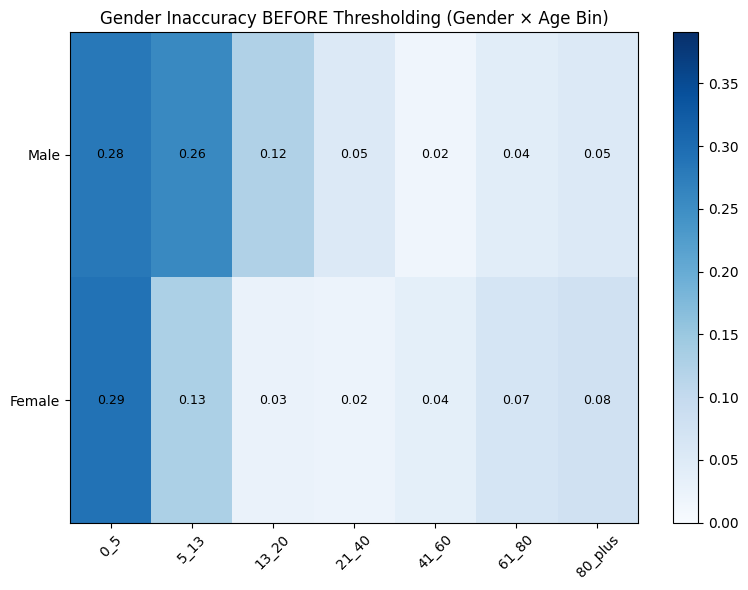

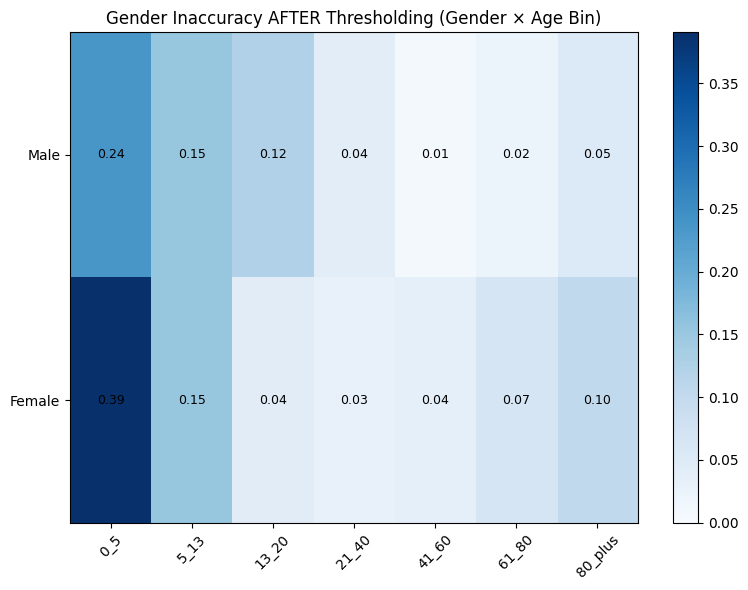

In [59]:
gender_age_default = compute_heatmap_group_metrics(
    test_results_default,
    ["true_gender", "age_bin"],
    gender_correct_col="gender_correct"
)

ga_acc_default = to_matrix(gender_age_default, "gender", "age_bin", "gender_acc")
ga_mae_default = to_matrix(gender_age_default, "gender", "age_bin", "age_mae")
ga_inacc_default = 1 - ga_acc_default

ga_acc_default = reorder_matrix(ga_acc_default, gender_order, age_order)
ga_mae_default = reorder_matrix(ga_mae_default, gender_order, age_order)
ga_inacc_default = reorder_matrix(ga_inacc_default, gender_order, age_order)

# thresholded
gender_age_adjusted = compute_heatmap_group_metrics(
    test_results_adjusted,
    ["true_gender", "age_bin"],
    gender_correct_col="gender_correct_adjusted"
)

ga_acc_adjusted = to_matrix(gender_age_adjusted, "gender", "age_bin", "gender_acc")
ga_mae_adjusted = to_matrix(gender_age_adjusted, "gender", "age_bin", "age_mae")
ga_inacc_adjusted = 1 - ga_acc_adjusted

ga_acc_adjusted = reorder_matrix(ga_acc_adjusted, gender_order, age_order)
ga_mae_adjusted = reorder_matrix(ga_mae_adjusted, gender_order, age_order)
ga_inacc_adjusted = reorder_matrix(ga_inacc_adjusted, gender_order, age_order)

# plot
vmin = min(ga_inacc_default.min().min(), ra_inacc_adjusted.min().min())
vmax = max(ga_inacc_default.max().max(), ra_inacc_adjusted.max().max())

plot_heatmap(
    ga_inacc_default,
    "Gender Inaccuracy BEFORE Thresholding (Gender × Age Bin)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

plot_heatmap(
    ga_inacc_adjusted,
    "Gender Inaccuracy AFTER Thresholding (Gender × Age Bin)",
    cmap="Blues",
    vmin=vmin,
    vmax=vmax
)

# plot_heatmap(
#     ga_mae_default,
#     "Age MAE BEFORE Thresholding (Gender × Age Bin)",
#     cmap="Reds"
# )

# plot_heatmap(
#     ga_mae_adjusted,
#     "Age MAE AFTER Thresholding (Gender × Age Bin)",
#     cmap="Reds"
# )

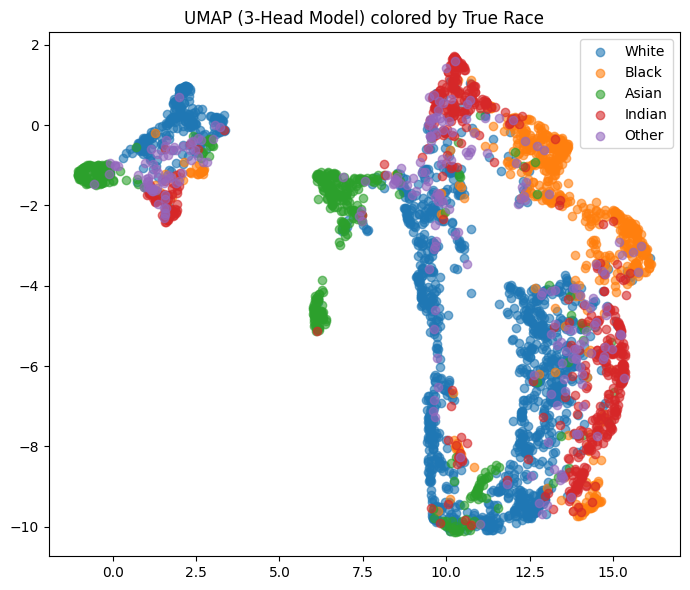

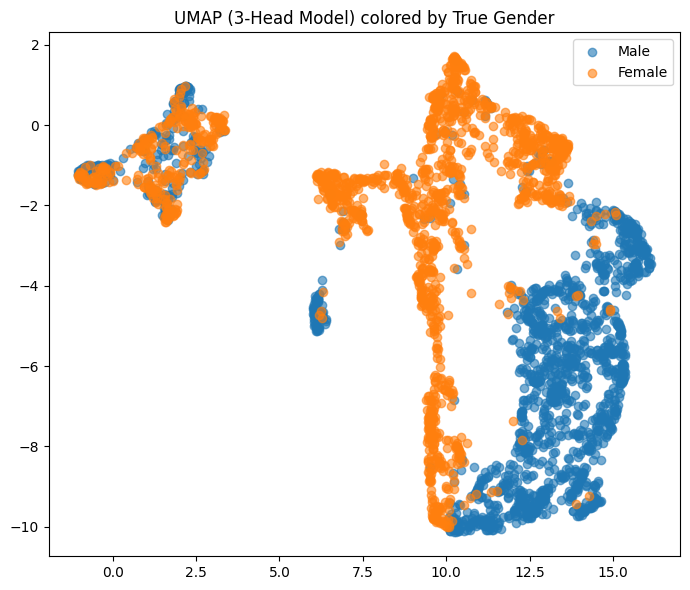

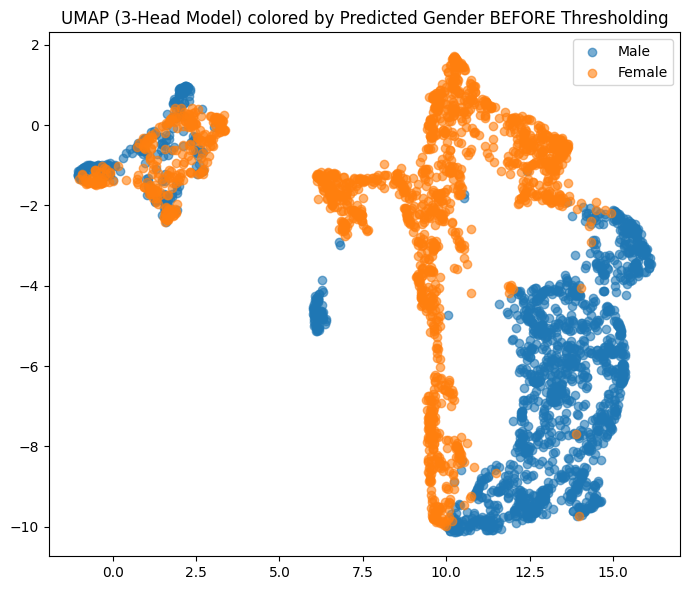

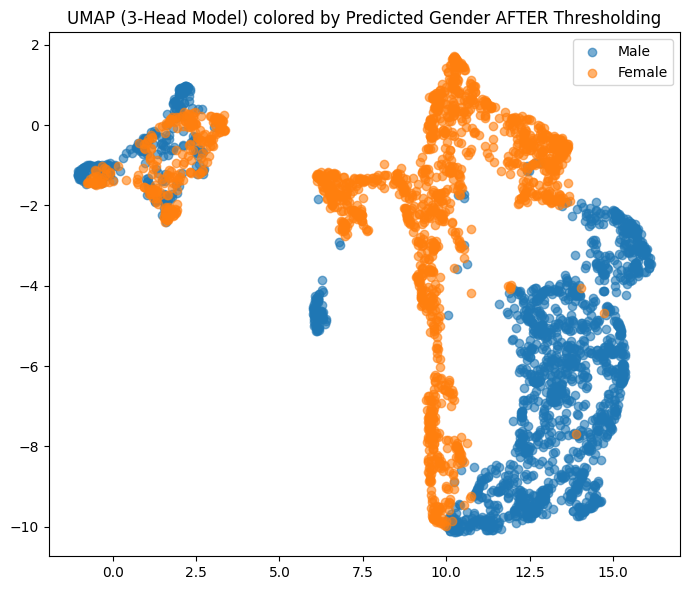

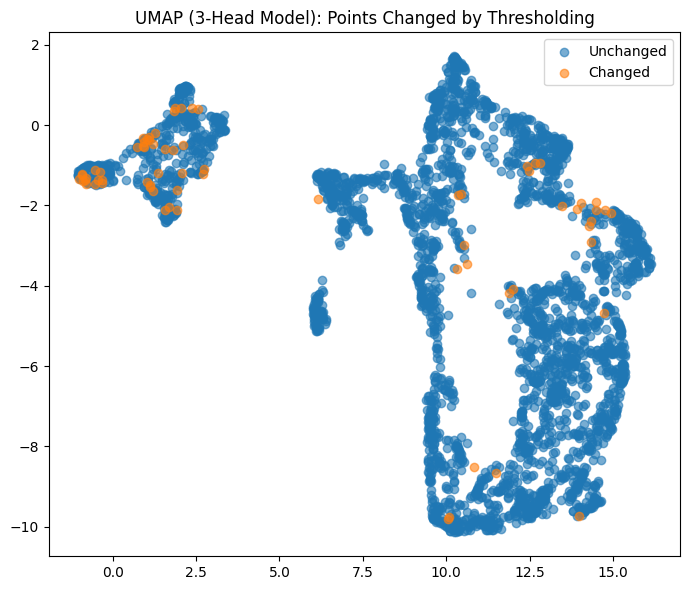

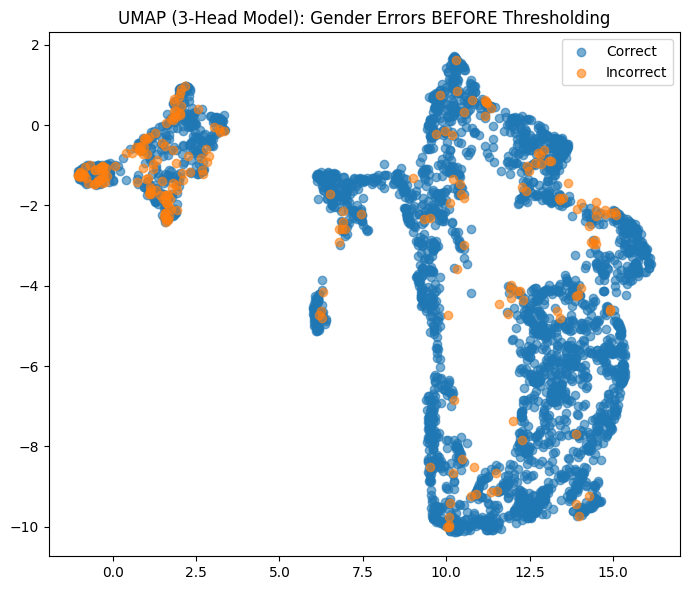

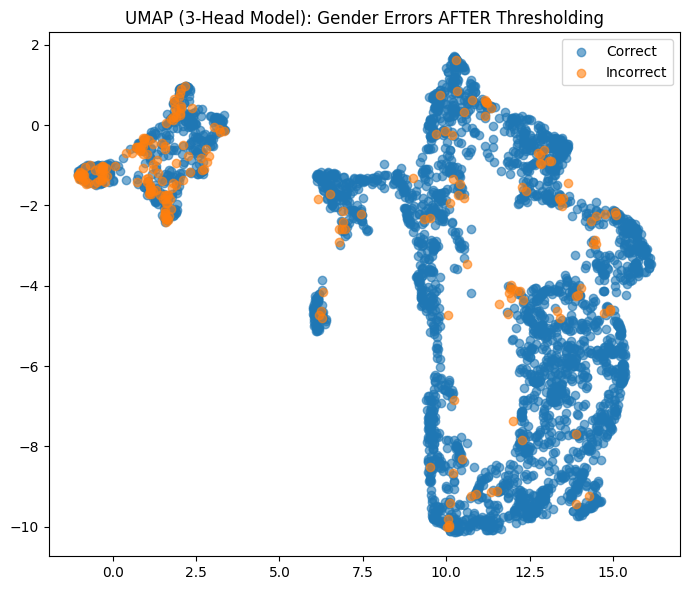

In [60]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import umap

# =========================================================
# 1. EXTRACT EMBEDDINGS + PREDICTIONS FROM 3-HEAD MODEL
# =========================================================

def collect_embeddings_and_predictions(model, loader, device):
    model.eval()

    all_embeddings = []
    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            features = model.backbone(images)

            age_pred = model.age_head(features).squeeze(1)
            gender_logit = model.gender_head(features).squeeze(1)
            race_logits = model.race_head(features)

            gender_prob = torch.sigmoid(gender_logit)
            pred_gender_default = (gender_prob >= 0.5).int()
            pred_race = torch.argmax(race_logits, dim=1)

            all_embeddings.append(features.cpu())

            for i in range(len(images)):
                results.append({
                    "true_age": float(ages[i].item()),
                    "pred_age": float(age_pred[i].item()),
                    "age_error": float(age_pred[i].item() - ages[i].item()),

                    "true_gender_num": int(genders[i].item()),
                    "pred_gender_num": int(pred_gender_default[i].item()),
                    "gender_prob": float(gender_prob[i].item()),

                    "true_race_num": int(races[i].item()),
                    "pred_race_num": int(pred_race[i].item()),

                    "true_race": race_map[int(races[i].item())],
                    "pred_race": race_map[int(pred_race[i].item())],
                    "true_gender": gender_map[int(genders[i].item())],

                    "age_bin": str(age_bins[i])
                })

    emb = torch.cat(all_embeddings, dim=0).numpy()
    df_preds = pd.DataFrame(results)

    return emb, df_preds

    emb = torch.cat(all_embeddings, dim=0).numpy()
    df_preds = pd.DataFrame(results)

    return emb, df_preds


# =========================================================
# 2. APPLY THRESHOLDS TO GET ADJUSTED GENDER PREDICTIONS
# =========================================================

def apply_race_specific_gender_thresholds(results_df, thresholds):
    out = results_df.copy()

    out["gender_threshold"] = out["pred_race_num"].map(thresholds).fillna(0.5)
    out["pred_gender_adjusted"] = (
        out["gender_prob"] >= out["gender_threshold"]
    ).astype(int)

    out["gender_correct_default"] = (
        out["pred_gender_num"] == out["true_gender_num"]
    ).astype(int)

    out["gender_correct_adjusted"] = (
        out["pred_gender_adjusted"] == out["true_gender_num"]
    ).astype(int)

    return out


# =========================================================
# 3. SIMPLE UMAP PLOTTING HELPER
# =========================================================

def plot_umap(X_umap, labels, label_map=None, title=""):
    plt.figure(figsize=(7, 6))

    labels = np.array(labels)
    unique_labels = np.unique(labels)

    for lab in unique_labels:
        mask = labels == lab
        name = label_map[lab] if label_map is not None and lab in label_map else str(lab)

        plt.scatter(
            X_umap[mask, 0],
            X_umap[mask, 1],
            label=name,
            alpha=0.6
        )

    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


# =========================================================
# 4. COLLECT TEST EMBEDDINGS + DEFAULT PREDICTIONS
# =========================================================

embeddings_3head, umap_results = collect_embeddings_and_predictions(
    resnet_model,
    test_loader,
    device
)

# apply thresholding
umap_results = apply_race_specific_gender_thresholds(umap_results, thresholds)


# =========================================================
# 5. RECALCULATE UMAP IN THIS NOTEBOOK
# =========================================================

reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    random_state=42
)

X_umap_3head = reducer.fit_transform(embeddings_3head)


# =========================================================
# 6. PLOT TRUE LABELS / DEFAULT / THRESHOLDED / CHANGES
# =========================================================

# true race
plot_umap(
    X_umap_3head,
    umap_results["true_race_num"].values,
    race_map,
    "UMAP (3-Head Model) colored by True Race"
)

# true gender
plot_umap(
    X_umap_3head,
    umap_results["true_gender_num"].values,
    gender_map,
    "UMAP (3-Head Model) colored by True Gender"
)

# default gender prediction
plot_umap(
    X_umap_3head,
    umap_results["pred_gender_num"].values,
    gender_map,
    "UMAP (3-Head Model) colored by Predicted Gender BEFORE Thresholding"
)

# thresholded gender prediction
plot_umap(
    X_umap_3head,
    umap_results["pred_gender_adjusted"].values,
    gender_map,
    "UMAP (3-Head Model) colored by Predicted Gender AFTER Thresholding"
)

# changed vs unchanged
changed = (
    umap_results["pred_gender_num"].values !=
    umap_results["pred_gender_adjusted"].values
).astype(int)

change_map = {0: "Unchanged", 1: "Changed"}

plot_umap(
    X_umap_3head,
    changed,
    change_map,
    "UMAP (3-Head Model): Points Changed by Thresholding"
)

# default errors
default_errors = (
    umap_results["pred_gender_num"].values !=
    umap_results["true_gender_num"].values
).astype(int)

error_map = {0: "Correct", 1: "Incorrect"}

plot_umap(
    X_umap_3head,
    default_errors,
    error_map,
    "UMAP (3-Head Model): Gender Errors BEFORE Thresholding"
)

# adjusted errors
adjusted_errors = (
    umap_results["pred_gender_adjusted"].values !=
    umap_results["true_gender_num"].values
).astype(int)

plot_umap(
    X_umap_3head,
    adjusted_errors,
    error_map,
    "UMAP (3-Head Model): Gender Errors AFTER Thresholding"
)

In [61]:
print((pred_default != pred_adjusted).sum())

NameError: name 'pred_default' is not defined

In [62]:
print(test_results_adjusted["gender_correct_adjusted"].mean() -
      test_results_default["gender_correct"].mean())

0.00029726516052319685
